In [1]:
from PIL import Image
import numpy as np 
import os 


import numpy as np
import matplotlib.pyplot as pl
import torch
import ot
import ot.plot

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Enable interactive mode
%matplotlib ipympl
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

In [2]:

# Functions from @Mateen Ulhaq and @karlo for visualizing 3d points with equal scaling of axes
def set_axes_equal(ax: plt.Axes):
    """Set 3D plot axes to equal scale.

    Make axes of 3D plot have equal scale so that spheres appear as
    spheres and cubes as cubes.  Required since `ax.axis('equal')`
    and `ax.set_aspect('equal')` don't work on 3D.
    """
    limits = np.array([
        ax.get_xlim3d(),
        ax.get_ylim3d(),
        ax.get_zlim3d(),
    ])
    origin = np.mean(limits, axis=1)
    radius = 0.5 * np.max(np.abs(limits[:, 1] - limits[:, 0]))
    _set_axes_radius(ax, origin, radius)

def _set_axes_radius(ax, origin, radius):
    x, y, z = origin
    ax.set_xlim3d([x - radius, x + radius])
    ax.set_ylim3d([y - radius, y + radius])
    ax.set_zlim3d([z - radius, z + radius])


# Load domain shape (hotdog)

In [18]:
import sys
sys.path.append("../")
from scene import GaussianModel
target_gaussians = GaussianModel(3)
target_gaussians.optimizer = torch.optim.Adam([target_gaussians._xyz], lr=1e-1)
target_gaussians.active_sh_degree, target_gaussians._xyz, target_gaussians._features_dc, \
target_gaussians._features_rest, target_gaussians._scaling, target_gaussians._rotation, \
target_gaussians._opacity, target_gaussians.max_radii2D, \
_, _, _, target_gaussians.spatial_lr_scale = \
    torch.load("/home/dimakot55/output_data/gs_my/gs/GT_hotdog_spheres_v4/chkpnt30000.pth")[0]
    # torch.load("/home/dimakot55/output_data/gs_my/gs/GT_hotdog_spheres/chkpnt30000.pth")[0]
    #torch.load("/home/dimakot55/output_data/gs/GT_hotdog_spheres_v1/chkpnt30000.pth")[0]
    

In [19]:

import torch
import torch.nn.functional as F
from scipy.spatial import distance
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA


def sample_points_by_density(points, num_samples=None, radius = 0.05, device='cuda'):
    """
    Samples points inversely proportional to their density in the neighborhood.
    :param points: torch tensor of shape [N,3]
    :param num_samples: Number of samples to be drawn according to the
        distribution of densities. If None, then we sample 1/10th of the points.
    :param radius: Radius of the local region around each point at which we compute
        the number of neighbors.
    :param device: Device on which the tensors are stored and computations will be done.
    :return: A torch tensor of shape [num_samples] containing the indices of the sampled points
    """


    # Assuming you have a PyTorch tensor of shape [N, 3] representing points
    # Calculate pairwise distances between all points
    # Note that i only compute distance to every 10th neighbor.
    distances = torch.cdist(points, points[::10])


    # Calculate the number of points within the local region for each point
    num_points_in_local_region = (distances <= radius).sum(dim=1)

    # Calculate the inverse density as a weight
    inverse_density = 1.0 / (num_points_in_local_region + 1)  # Add 1 to avoid division by zero

    # Normalize the weights to create a probability distribution
    probability_distribution = inverse_density / inverse_density.sum()

    # Sample points inversely proportional to their density
    if num_samples is None:
        num_samples = len(points) // 10  # Adjust the number of samples as needed
    sampled_indices = torch.multinomial(probability_distribution, num_samples, replacement=True)

    return sampled_indices
    
def remove_outliers(points, kth_neighbor=20, q=0.925, device='cuda'):
    """
    Removes outliers from the given points. Usually the set of clusters must be small to avoid
    quadratic complexity of the all pairwise neighbors computation.
    :param points: torch tensor of shape [N, 3]
    :param kth_neighbor: this neighbor we use to approximate good neighborhood density.
    :param q: Quantile to use for removing outliers.
    :param device: Device on which the tensors are stored and computations will be done.
    :return: A torch tensor of shape [N] containing the indices of the non-outlier points.
    """

    pairwise_distances = torch.cdist(points, points)
    kth_nearest_dists, kth_nearest_indices = torch.topk(pairwise_distances, k=kth_neighbor, dim=1, largest=False, sorted=True)
    q_outliers = torch.quantile(kth_nearest_dists[:, kth_neighbor-1], q=q)
    indcs_relevant = torch.where(kth_nearest_dists[:, kth_neighbor-1] < q_outliers)[0]
    return indcs_relevant

def prepare_scene(points, num_clusters=40, num_samples=None, radius=0.05, q=0.925, device='cuda'):
    """
    Prepares the scene by sampling points and clustering them.
    :param points: torch tensor of shape [N, 3]
    :param num_clusters: Number of clusters to use for KMeans clustering.
    :param num_samples: Number of samples to be drawn according to the
        distribution of densities. If None, then we sample 1/10th of the points from EACH cluster
    :param radius: Radius of the local region around each point at which we compute
        the number of neighbors.
    :param device: Device on which the tensors are stored and computations will be done.
    :return: A tuple containing the following tensors:
    """

     # Use KMeans clustering to find the centroids of the clusters
    kmeans = KMeans(init="k-means++", n_clusters=num_clusters, n_init=4)
    kmeans.fit(points.detach().cpu().numpy())
    clean_indices = []
    for lbls in np.unique(kmeans.labels_):
        cluster_points_idcs = np.where(kmeans.labels_ == lbls)[0]
        # Remove outliers
        non_outliers_idcs = remove_outliers(points[cluster_points_idcs], q=q, device=device)
        cluster_points_idcs = cluster_points_idcs[non_outliers_idcs.cpu().numpy()]
        # Sample points inversely proportional to the density
        sampled_idcs = sample_points_by_density(points[cluster_points_idcs], num_samples, radius, device)
        cluster_points_idcs = cluster_points_idcs[sampled_idcs.cpu().numpy()]
        clean_indices.append(cluster_points_idcs)

    return clean_indices, kmeans.cluster_centers_, kmeans.labels_[np.concatenate(clean_indices)]


In [20]:
target_shape_idcs, target_shape_cluster_centers, target_shape_cluster_labels = prepare_scene(
    points=target_gaussians._xyz,
    num_samples=None,
    radius=0.05,
    q=0.975,
    num_clusters=80)


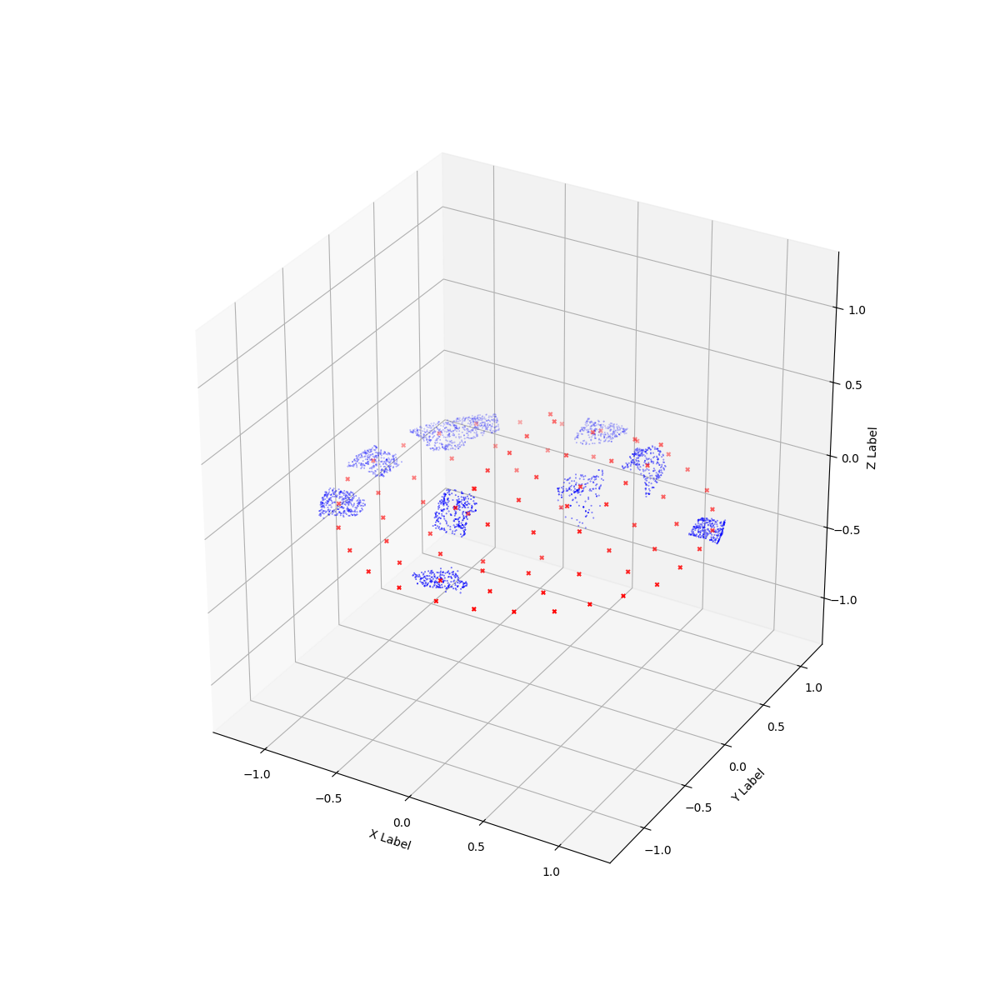

In [17]:

# Create a 3D scatter plot
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
#ax.axis('equal')
ax.set_aspect('equal')
# Plot target shape

# Plot the scatter points
kth=1
if True:
    arr_shape = target_gaussians._xyz[np.concatenate(target_shape_idcs[20:30], axis=0)].detach().cpu().numpy()
    ax.scatter(arr_shape[::kth,0], 
               arr_shape[::kth,1], 
               arr_shape[::kth,2], c='b', marker='o',s=0.1)

ax.scatter(target_shape_cluster_centers[:, 0],
           target_shape_cluster_centers[:, 1],
           target_shape_cluster_centers[:, 2],
           c='r', marker='x', s=10.)

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
# ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
set_axes_equal(ax) # IMPORTANT - this is also required
plt.show()



In [21]:

plt.close()

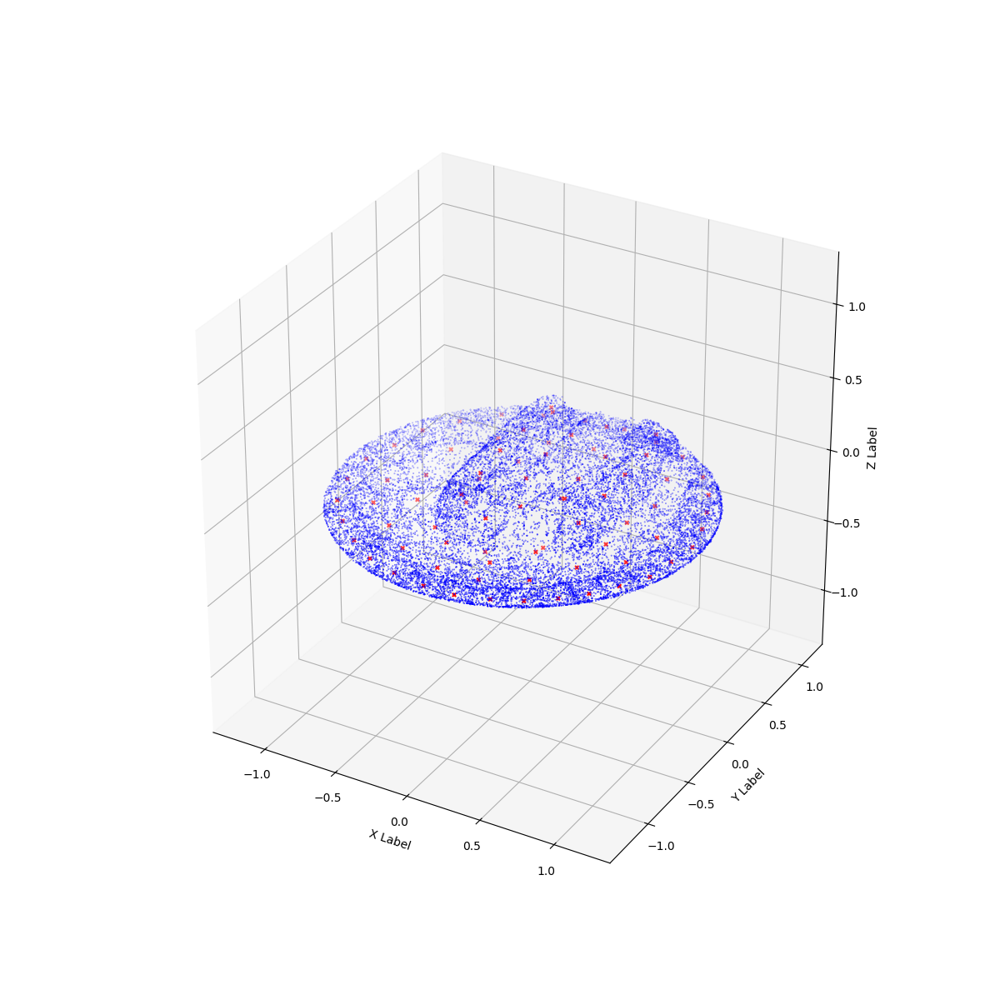

In [22]:

# Create a 3D scatter plot
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
#ax.axis('equal')
ax.set_aspect('equal')
# Plot target shape

# Plot the scatter points
kth=1
if True:
    arr_shape = target_gaussians._xyz[np.concatenate(target_shape_idcs, axis=0)].detach().cpu().numpy()
    ax.scatter(arr_shape[::kth,0], 
               arr_shape[::kth,1], 
               arr_shape[::kth,2], c='b', marker='o',s=0.1)

ax.scatter(target_shape_cluster_centers[:, 0],
           target_shape_cluster_centers[:, 1],
           target_shape_cluster_centers[:, 2],
           c='r', marker='x', s=10.)

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
# ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
set_axes_equal(ax) # IMPORTANT - this is also required
plt.show()



# Load cluster patch(from lego) and visualize

In [23]:
loaded_data = np.load("/home/dimakot55/output_data/gs/GT_lego_spheres_v5_clusters_100/cluster_51.npz") # 51, 36, 49, 24, 40, 57, 45, 22, 20, 3, 32, 25,  19, 16, 17, 15, 13, 14

# Access the arrays by their names
gaussians_xyz = loaded_data['_xyz']
gaussians_features_dc = loaded_data['_features_dc']
gaussians_features_rest = loaded_data['_features_rest']
gaussians_rotation = loaded_data['_rotation']
gaussians_scaling = loaded_data['_scaling']
gaussians_opacity = loaded_data['_opacity']

# 1. Remove poitns that are too far away from all othe points. These are just noise
# Compute all pairwise distances between points
from scipy.spatial import distance
k=30
pairwise_distances = distance.cdist(gaussians_xyz, gaussians_xyz, 'euclidean')
# Use np.partition to find the k-th smallest distances for each row
kth_nearest_indices = np.argpartition(pairwise_distances, k, axis=1)[:, :k]
kth_nearest_distances = np.take_along_axis(pairwise_distances, kth_nearest_indices, axis=1)
q_outliers = np.quantile(np.max(kth_nearest_distances, axis=-1), 0.925)
idcs_relevant = np.where(np.max(kth_nearest_distances, axis=-1) < q_outliers)[0]
gaussians_xyz = loaded_data['_xyz'][idcs_relevant]
gaussians_features_dc = loaded_data['_features_dc'][idcs_relevant]
gaussians_features_rest = loaded_data['_features_rest'][idcs_relevant]
gaussians_rotation = loaded_data['_rotation'][idcs_relevant]
gaussians_scaling = loaded_data['_scaling'][idcs_relevant]
gaussians_opacity = loaded_data['_opacity'][idcs_relevant]

# preprocess colors
colors = np.array(gaussians_features_dc[:,0])
#colors = (colors - np.min(colors)) / (np.max(colors) - np.min(colors))
def sigmoid(x):
    return 1 / (1 + np.exp(-x))
colors=sigmoid(colors)

# preprocess sizes. Transform scaling to a format somewhat acceptable 
# by the ax.scatter function
sizes = np.array(gaussians_scaling[:,0])
q05 = np.quantile(sizes, 0.5)
#sizes = sizes * (sizes > q05)
sizes = -sizes * 4. 

# Transform opacity to the format acceptable by ax.scatter
alpha = np.array(gaussians_opacity[:,0])
#alpha = alpha / np.max(alpha)
alpha = np.clip(alpha, 0., 1.)


# Extra increase the volume of the points to make results more apparent
with torch.no_grad():
    gaussians_xyz[:,2] = gaussians_xyz[:,2]*1.5

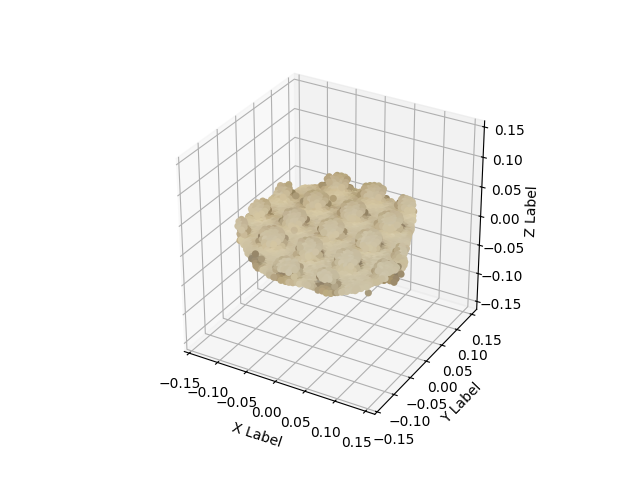

In [24]:


# Create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
#ax.axis('equal')
#ax.set_aspect('equal')
# Plot the scatter points
ax.scatter(gaussians_xyz[:,0], 
           gaussians_xyz[:,1], 
           gaussians_xyz[:,2],#*1.5, 
           c=np.concatenate([colors, alpha[:,None]], axis=-1),# c='b', 
           marker='o',
           s=sizes, #s=25.,
           #alpha=alpha,
           depthshade=False,
           edgecolors='none')
           #fillstyle='full',
           #markeredgecolor='red',
           #markeredgewidth=0.0)

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
# ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
set_axes_equal(ax) # IMPORTANT - this is also required
plt.show()





# Fit style patch to different clusters from the domain

In [25]:
def get_descriptors(X, X_nns_indices):
    """
    Returns a matrix of distances between all points specified in the X_nns_indices matrix.
    :param X: tensor or shape [N,d]
    :param X_nns_indices: tensor of shape [N,k]
    :return 
        distances_nns : tensor of shape [N, k,k] with pairwise distances between all of the 
            k NNs for every sample in X.
    """
    
    X_nns = X[X_nns_indices]
    # All pairs can be too much
    # distances_nns = torch.norm(X_nns.unsqueeze(1) - X_nns.unsqueeze(2), dim=-1)
    # Just take all distances to the nearest neighbors
    distances_nns = torch.norm(X_nns[:,1:] - X_nns[:,0].unsqueeze(1), dim=-1)
    return distances_nns

def get_loss_domain_adaptation(X, domain, domain_NNs=20):
    """
    Try to approximate every point from X to the point from domain
    """
    
    D_to_domain = torch.cdist(X, domain)
    #print("D_to_domain.shape:", D_to_domain.shape)
    sorted_values, _ = torch.sort(D_to_domain, dim=1)  # Sort each row along dimension 1
    D_to_domain_mask = (D_to_domain <= sorted_values[:, domain_NNs - 1:domain_NNs])
    D_to_domain_mask = D_to_domain_mask.to(dtype=torch.float32)
    loss_D_to_domain = torch.mean(torch.square(D_to_domain)*D_to_domain_mask)
    # loss_D_to_domain = torch.mean(D_to_domain)
    return loss_D_to_domain
    
def fit_target_to_domain(target_points, domain_points, device="cuda", verbose=True):
    target_points_torch = torch.tensor(target_points, device=device)
    domain_points_torch = torch.tensor(domain_points.clone().detach(), device=device)
    
    domain_std = torch.std(domain_points_torch, dim=0)
    domain_mean = torch.mean(domain_points_torch, dim=0)
    # Init random
    #points_torch = torch.nn.Parameter(torch.randn_like(target_points_torch, device=device) * domain_std*3 + domain_mean ) 
    # Init with target points
    points_torch = torch.nn.Parameter(torch.tensor(target_points_torch, device=device) * domain_std*5. + domain_mean ) 
    #print(torch.std(domain_points_torch.detach(), dim=0))
    #print(torch.mean(domain_points_torch.detach(), dim=0))

    
    #print(domain_mean, domain_std)
    #points_torch = points_torch * domain_std * 2.  + domain_mean
    #print("points_torch.shape:", points_torch.shape) 
    # Compute nearest neighbors and target descriptors for both points and vecs
    num_nns = 2000
    kth_nn = 20
    num_nns_local = 100 # was 100
    kth_nn_local = 1
    distances = torch.cdist(target_points_torch, target_points_torch)
    _, nns_indices = torch.topk(distances, k=num_nns, largest=False, dim=-1)
    target_descriptor_points = get_descriptors(X=target_points_torch, X_nns_indices=nns_indices[::kth_nn])
    #print("target_descriptor_points.shape:", target_descriptor_points.shape)
    
    # Now add even stronger local loss
    
    _, nns_indices_local = torch.topk(distances, k=num_nns_local, largest=False, dim=-1)
    target_descriptor_points_local = get_descriptors(X=target_points_torch, X_nns_indices=nns_indices_local[::kth_nn_local])
    #print("target_descriptor_points.shape:", target_descriptor_points.shape)
    
    
    optimizer = torch.optim.Adam([points_torch], lr=2e-3)
    w_loss_local2 = 1e2 
  
    for iter in range(1001):
        if iter==10000:
            for g in optimizer.param_groups:
                g['lr'] = 1e-2
            w_loss_local2 = 1e3
            
        descriptor_points = get_descriptors(X=points_torch, X_nns_indices=nns_indices[::kth_nn])
        loss_points_local = torch.mean(torch.square(descriptor_points - target_descriptor_points))#*D_pairwise_target_mask)
        
        descriptor_points2 = get_descriptors(X=points_torch, X_nns_indices=nns_indices_local[::kth_nn_local])
        loss_points_local2 = torch.mean(torch.square(descriptor_points2 - target_descriptor_points_local))#*D_pairwise_target_mask)
        
        loss_domain = get_loss_domain_adaptation(X=points_torch, domain=domain_points_torch)
        
        #loss = loss_points_local*5e0 + loss_points_local2*1e2 + loss_domain * 3e2
        loss = loss_points_local*5e0 + loss_points_local2*1e2 + loss_domain * 3e1 #+ loss_domain_coverage * 1e1
        
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        if iter % 100 == 0 and verbose:
            print(f"loss_points_local:{loss_points_local:.7f}, loss_points_local2:{loss_points_local2:.7f}, loss_domain:{loss_domain:.7f}")
    

    # for iter in range(1001):
    #     descriptor_points = get_descriptors(X=points_torch, X_nns_indices=nns_indices[::kth_nn])
    #     loss_points_local = torch.mean(torch.square(descriptor_points - target_descriptor_points))#*D_pairwise_target_mask)
        
    #     descriptor_points2 = get_descriptors(X=points_torch, X_nns_indices=nns_indices_local[::kth_nn_local])
    #     loss_points_local2 = torch.mean(torch.square(descriptor_points2 - target_descriptor_points_local))#*D_pairwise_target_mask)
        
    #     loss_domain = get_loss_domain_adaptation(X=points_torch, domain=domain_points_torch)
        
    #     #loss = loss_points_local*5e0 + loss_points_local2*1e2 + loss_domain * 3e2
    #     loss = loss_points_local*0e0 + loss_points_local2*5e1 + loss_domain * 0e1 #+ loss_domain_coverage * 1e1
        
    #     loss.backward()
    #     optimizer.step()
    #     optimizer.zero_grad()
    #     if iter % 100 == 0 and verbose:
    #         print(f"loss_points_local:{loss_points_local:.7f}, loss_points_local2:{loss_points_local2:.7f}, loss_domain:{loss_domain:.7f}")

    return points_torch.detach()







/tmp/ipykernel_3583812/3419894461.py:34: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  domain_points_torch = torch.tensor(domain_points.clone().detach(), device=device)
/tmp/ipykernel_3583812/3419894461.py:41: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  points_torch = torch.nn.Parameter(torch.tensor(target_points_torch, device=device) * domain_std*5. + domain_mean )


loss_points_local:0.0029527, loss_points_local2:0.0001182, loss_domain:0.0011541
loss_points_local:0.0002374, loss_points_local2:0.0000076, loss_domain:0.0008300
loss_points_local:0.0002836, loss_points_local2:0.0000074, loss_domain:0.0007942
loss_points_local:0.0002843, loss_points_local2:0.0000073, loss_domain:0.0007899
loss_points_local:0.0002779, loss_points_local2:0.0000075, loss_domain:0.0007873
loss_points_local:0.0002668, loss_points_local2:0.0000070, loss_domain:0.0007876
loss_points_local:0.0002617, loss_points_local2:0.0000070, loss_domain:0.0007877
loss_points_local:0.0002601, loss_points_local2:0.0000070, loss_domain:0.0007873
loss_points_local:0.0002574, loss_points_local2:0.0000070, loss_domain:0.0007871
loss_points_local:0.0002493, loss_points_local2:0.0000070, loss_domain:0.0007858
loss_points_local:0.0002255, loss_points_local2:0.0000072, loss_domain:0.0007848


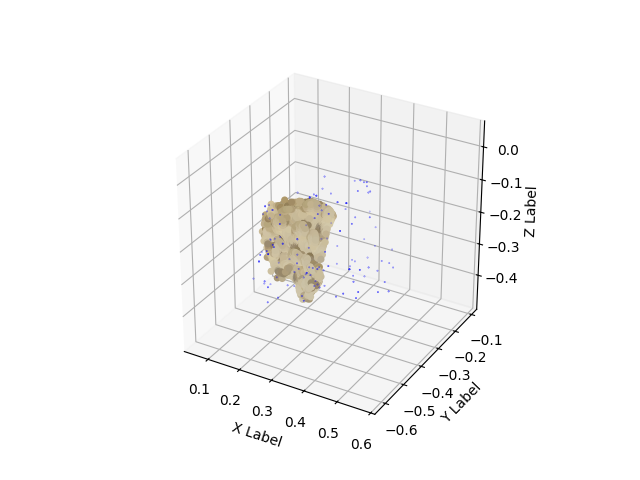

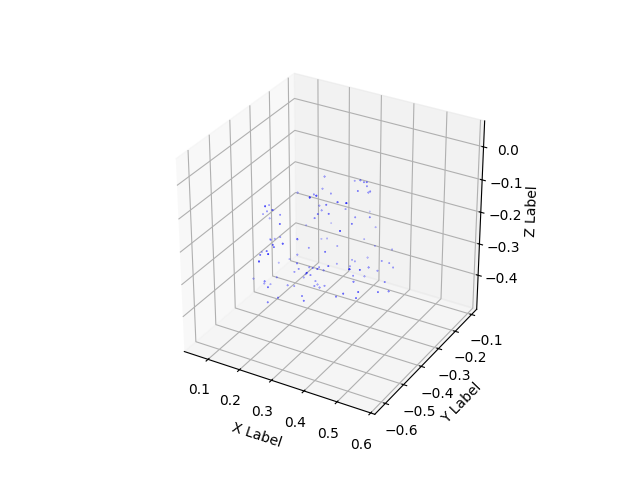

loss_points_local:0.0042985, loss_points_local2:0.0001695, loss_domain:0.0003867
loss_points_local:0.0000134, loss_points_local2:0.0000011, loss_domain:0.0002503
loss_points_local:0.0000090, loss_points_local2:0.0000007, loss_domain:0.0002388
loss_points_local:0.0000096, loss_points_local2:0.0000007, loss_domain:0.0002382
loss_points_local:0.0000097, loss_points_local2:0.0000007, loss_domain:0.0002381
loss_points_local:0.0000094, loss_points_local2:0.0000006, loss_domain:0.0002380
loss_points_local:0.0000092, loss_points_local2:0.0000006, loss_domain:0.0002378
loss_points_local:0.0000091, loss_points_local2:0.0000006, loss_domain:0.0002377
loss_points_local:0.0000088, loss_points_local2:0.0000006, loss_domain:0.0002375
loss_points_local:0.0000088, loss_points_local2:0.0000006, loss_domain:0.0002375
loss_points_local:0.0000087, loss_points_local2:0.0000006, loss_domain:0.0002375


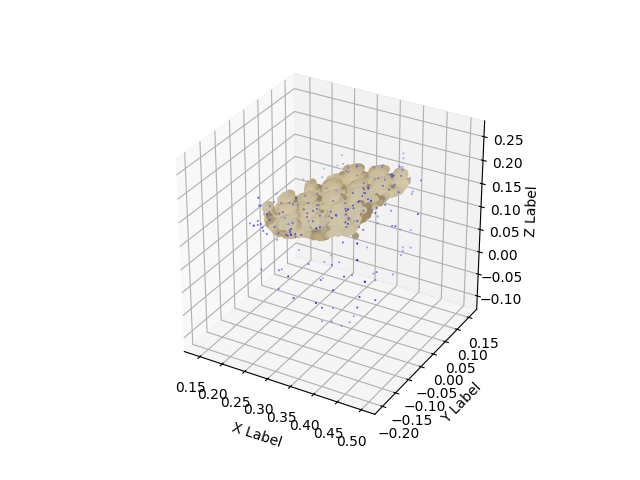

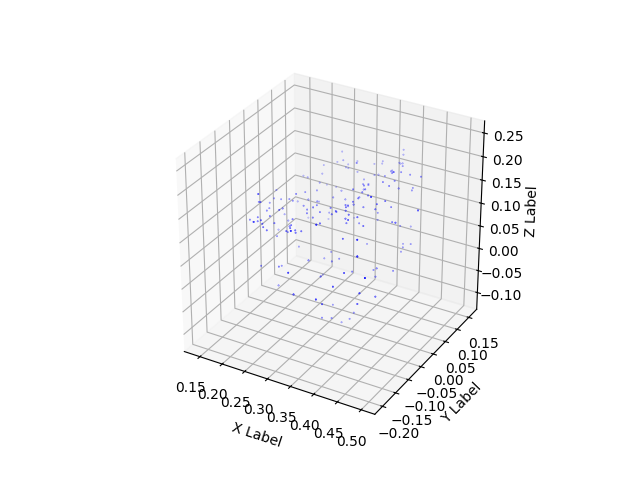

loss_points_local:0.0062376, loss_points_local2:0.0002525, loss_domain:0.0000158
loss_points_local:0.0000530, loss_points_local2:0.0000030, loss_domain:0.0000268
loss_points_local:0.0000091, loss_points_local2:0.0000004, loss_domain:0.0000272
loss_points_local:0.0000082, loss_points_local2:0.0000004, loss_domain:0.0000266
loss_points_local:0.0000080, loss_points_local2:0.0000004, loss_domain:0.0000263
loss_points_local:0.0000078, loss_points_local2:0.0000004, loss_domain:0.0000262
loss_points_local:0.0000077, loss_points_local2:0.0000004, loss_domain:0.0000262
loss_points_local:0.0000076, loss_points_local2:0.0000004, loss_domain:0.0000261
loss_points_local:0.0000076, loss_points_local2:0.0000004, loss_domain:0.0000261
loss_points_local:0.0000076, loss_points_local2:0.0000004, loss_domain:0.0000261
loss_points_local:0.0000076, loss_points_local2:0.0000004, loss_domain:0.0000261


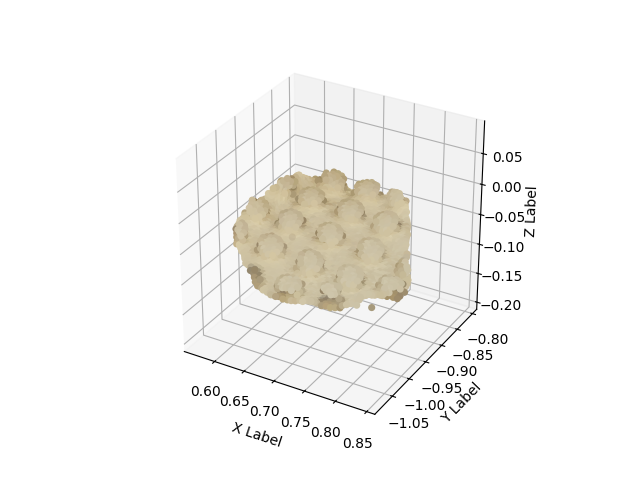

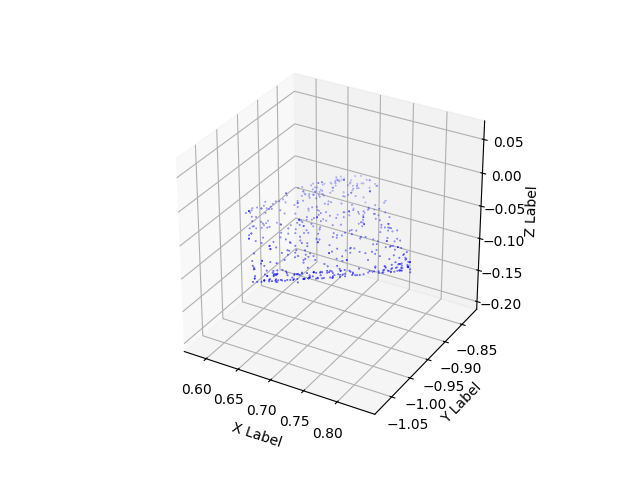

loss_points_local:0.0043068, loss_points_local2:0.0001850, loss_domain:0.0000560
loss_points_local:0.0000085, loss_points_local2:0.0000006, loss_domain:0.0000486
loss_points_local:0.0000007, loss_points_local2:0.0000001, loss_domain:0.0000469
loss_points_local:0.0000008, loss_points_local2:0.0000001, loss_domain:0.0000468
loss_points_local:0.0000008, loss_points_local2:0.0000001, loss_domain:0.0000468
loss_points_local:0.0000008, loss_points_local2:0.0000001, loss_domain:0.0000468
loss_points_local:0.0000008, loss_points_local2:0.0000001, loss_domain:0.0000468
loss_points_local:0.0000008, loss_points_local2:0.0000001, loss_domain:0.0000468
loss_points_local:0.0000008, loss_points_local2:0.0000001, loss_domain:0.0000468
loss_points_local:0.0000008, loss_points_local2:0.0000001, loss_domain:0.0000468
loss_points_local:0.0000008, loss_points_local2:0.0000001, loss_domain:0.0000468


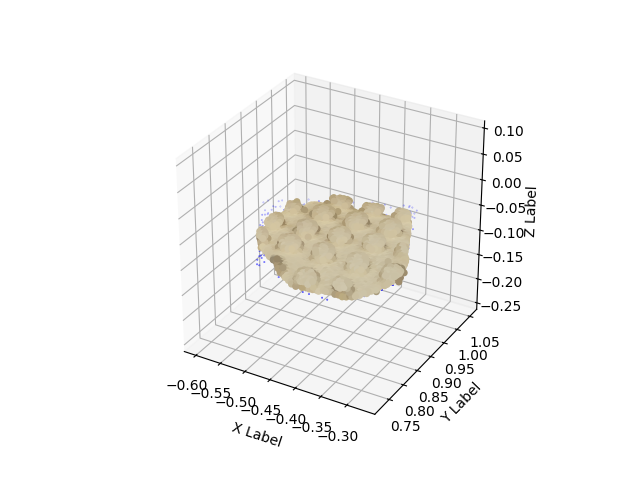

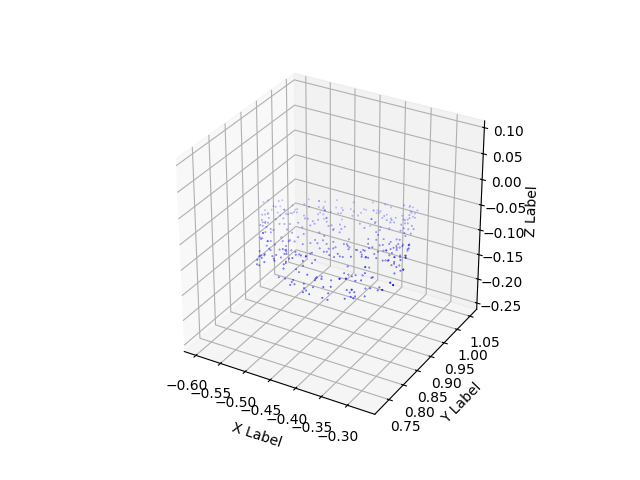

In [13]:
# target_shape_idcs, target_shape_cluster_centers, target_shape_cluster_labels
for cluster_domain_idcs in target_shape_idcs[20:24]:
    domain_points_cluster =  target_gaussians._xyz[cluster_domain_idcs]
    target_points_cluster = fit_target_to_domain(target_points=gaussians_xyz, 
                                                 domain_points=domain_points_cluster)
    
    # Create a 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    #ax.axis('equal')
    ax.set_aspect('equal')
    # Plot target shape
    
    # Plot the scatter points
    if True:
        arr_shape = domain_points_cluster.detach().cpu().numpy()
        ax.scatter(arr_shape[:,0], 
                   arr_shape[:,1], 
                   arr_shape[:,2], c='b', marker='o',s=0.1)
    
    
    # # Plot optimized points
    arr = target_points_cluster.detach().cpu().numpy()
    
    ax.scatter(arr[:,0], 
               arr[:,1], 
               arr[:,2], 
               c=np.concatenate([colors, alpha[:,None]], axis=-1),# c='b', 
               marker='o',
               s=sizes, #s=25.,
               #alpha=alpha,
               depthshade=False,
               edgecolors='none')
               #fillstyle='full',
               #markeredgecolor='red',
               #markeredgewidth=0.0)
    
    # Set labels for the axes
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    
    ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
    # ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
    set_axes_equal(ax) # IMPORTANT - this is also required
    plt.show()

    # Create a 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    #ax.axis('equal')
    ax.set_aspect('equal')
    # Plot target shape
    
    # Plot the scatter points
    if True:
        arr_shape = domain_points_cluster.detach().cpu().numpy()
        ax.scatter(arr_shape[:,0], 
                   arr_shape[:,1], 
                   arr_shape[:,2], c='b', marker='o',s=0.1)
    
    
    
    # Set labels for the axes
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    
    ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
    # ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
    set_axes_equal(ax) # IMPORTANT - this is also required
    plt.show()






/tmp/ipykernel_1190744/3736685777.py:34: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  domain_points_torch = torch.tensor(domain_points.clone().detach(), device=device)


loss_points_local:0.1767584, loss_points_local2:0.2404117, loss_domain:0.0040651
loss_points_local:0.0006868, loss_points_local2:0.0000157, loss_domain:0.0001249
loss_points_local:0.0005513, loss_points_local2:0.0000088, loss_domain:0.0000992
loss_points_local:0.0003950, loss_points_local2:0.0000069, loss_domain:0.0000945
loss_points_local:0.0000811, loss_points_local2:0.0000026, loss_domain:0.0000992
loss_points_local:0.0000126, loss_points_local2:0.0000010, loss_domain:0.0000791
loss_points_local:0.0000105, loss_points_local2:0.0000009, loss_domain:0.0000774
loss_points_local:0.0000100, loss_points_local2:0.0000008, loss_domain:0.0000772
loss_points_local:0.0000100, loss_points_local2:0.0000008, loss_domain:0.0000772
loss_points_local:0.0000101, loss_points_local2:0.0000008, loss_domain:0.0000771
loss_points_local:0.0000102, loss_points_local2:0.0000008, loss_domain:0.0000770
loss_points_local:0.0000102, loss_points_local2:0.0000008, loss_domain:0.0000770
loss_points_local:0.0000124,

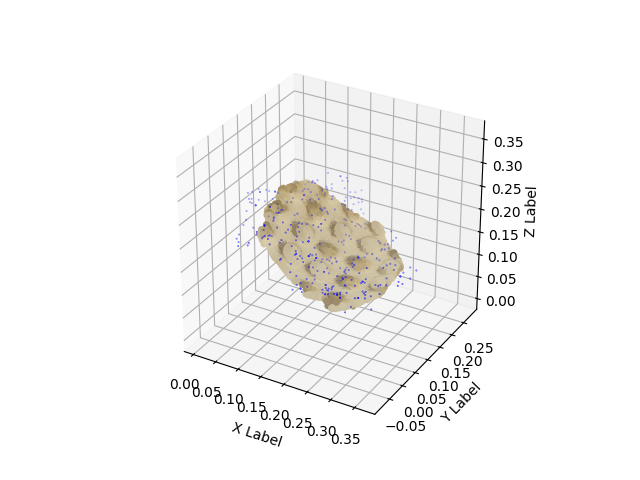

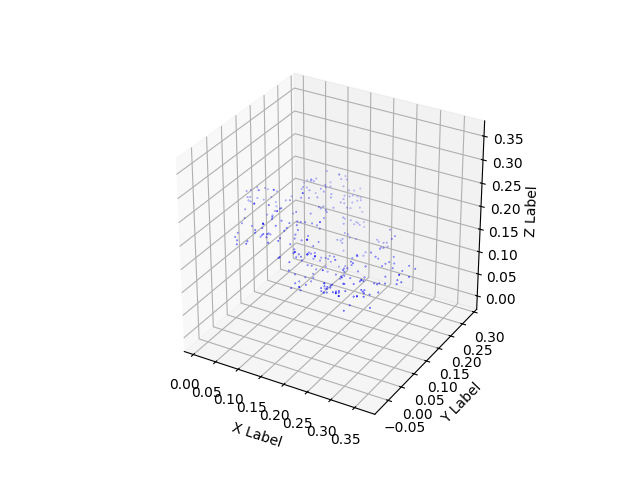

loss_points_local:0.1485258, loss_points_local2:0.2080290, loss_domain:0.0035779
loss_points_local:0.0004149, loss_points_local2:0.0000127, loss_domain:0.0001287
loss_points_local:0.0000048, loss_points_local2:0.0000007, loss_domain:0.0000621
loss_points_local:0.0000036, loss_points_local2:0.0000005, loss_domain:0.0000617
loss_points_local:0.0000040, loss_points_local2:0.0000005, loss_domain:0.0000616
loss_points_local:0.0000040, loss_points_local2:0.0000005, loss_domain:0.0000616
loss_points_local:0.0000040, loss_points_local2:0.0000005, loss_domain:0.0000616
loss_points_local:0.0000040, loss_points_local2:0.0000005, loss_domain:0.0000615
loss_points_local:0.0000039, loss_points_local2:0.0000005, loss_domain:0.0000614
loss_points_local:0.0000039, loss_points_local2:0.0000005, loss_domain:0.0000613
loss_points_local:0.0000039, loss_points_local2:0.0000005, loss_domain:0.0000613
loss_points_local:0.0000039, loss_points_local2:0.0000005, loss_domain:0.0000613
loss_points_local:0.0000005,

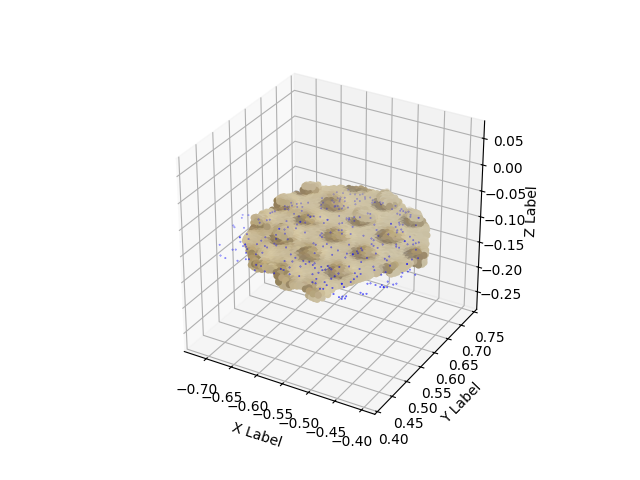

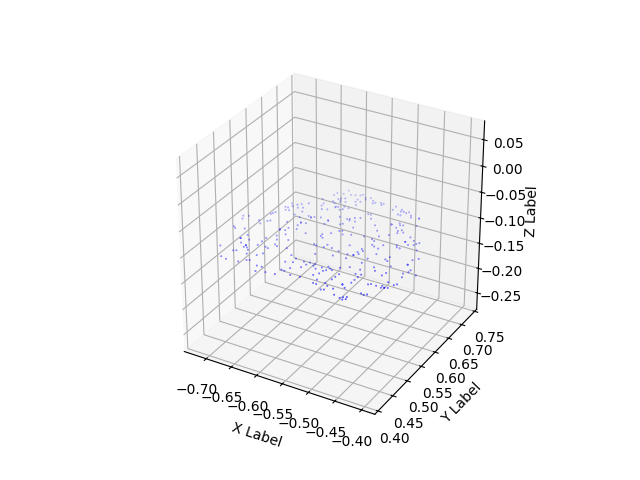

loss_points_local:0.2149150, loss_points_local2:0.2825269, loss_domain:0.0088425
loss_points_local:0.0005996, loss_points_local2:0.0000138, loss_domain:0.0002451
loss_points_local:0.0000375, loss_points_local2:0.0000027, loss_domain:0.0002273
loss_points_local:0.0000350, loss_points_local2:0.0000022, loss_domain:0.0002278
loss_points_local:0.0000347, loss_points_local2:0.0000022, loss_domain:0.0002277
loss_points_local:0.0000346, loss_points_local2:0.0000022, loss_domain:0.0002277
loss_points_local:0.0000346, loss_points_local2:0.0000022, loss_domain:0.0002277
loss_points_local:0.0000346, loss_points_local2:0.0000022, loss_domain:0.0002277
loss_points_local:0.0000346, loss_points_local2:0.0000022, loss_domain:0.0002277
loss_points_local:0.0000346, loss_points_local2:0.0000022, loss_domain:0.0002277
loss_points_local:0.0000346, loss_points_local2:0.0000022, loss_domain:0.0002277
loss_points_local:0.0000346, loss_points_local2:0.0000022, loss_domain:0.0002277
loss_points_local:0.0000016,

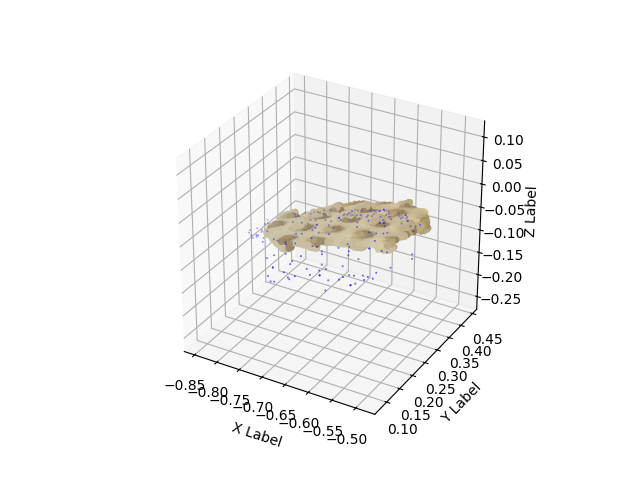

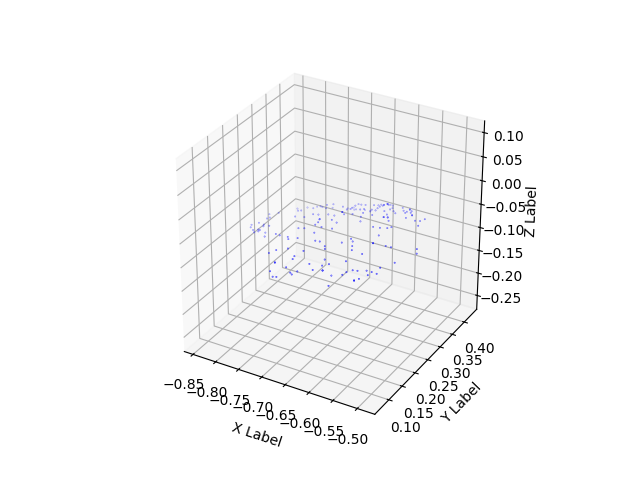

loss_points_local:0.1403577, loss_points_local2:0.1938793, loss_domain:0.0026963
loss_points_local:0.0006944, loss_points_local2:0.0000134, loss_domain:0.0000915
loss_points_local:0.0000194, loss_points_local2:0.0000015, loss_domain:0.0000474
loss_points_local:0.0000022, loss_points_local2:0.0000003, loss_domain:0.0000410
loss_points_local:0.0000021, loss_points_local2:0.0000003, loss_domain:0.0000408
loss_points_local:0.0000020, loss_points_local2:0.0000003, loss_domain:0.0000407
loss_points_local:0.0000020, loss_points_local2:0.0000003, loss_domain:0.0000407
loss_points_local:0.0000020, loss_points_local2:0.0000003, loss_domain:0.0000406
loss_points_local:0.0000019, loss_points_local2:0.0000003, loss_domain:0.0000406
loss_points_local:0.0000019, loss_points_local2:0.0000003, loss_domain:0.0000406
loss_points_local:0.0000019, loss_points_local2:0.0000003, loss_domain:0.0000406
loss_points_local:0.0000019, loss_points_local2:0.0000003, loss_domain:0.0000406
loss_points_local:0.0000005,

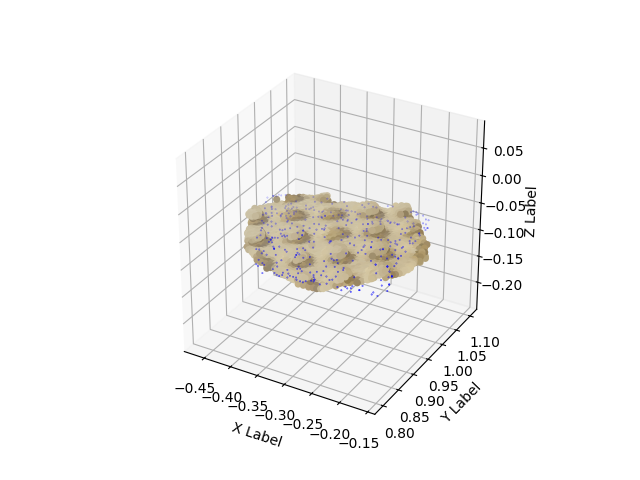

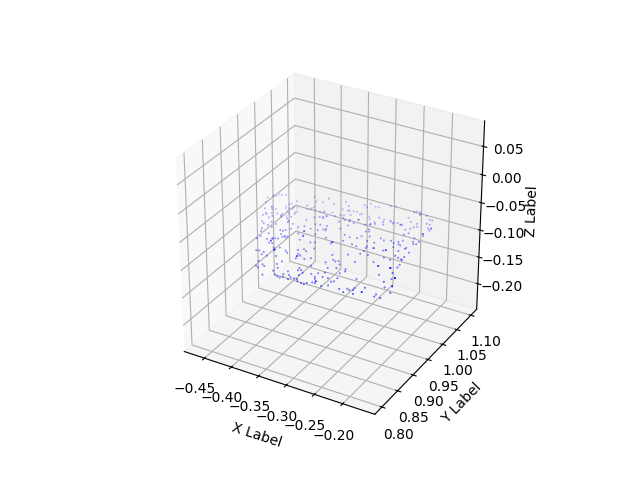

In [67]:
# target_shape_idcs, target_shape_cluster_centers, target_shape_cluster_labels
for cluster_domain_idcs in target_shape_idcs[24:28]:
    domain_points_cluster =  target_gaussians._xyz[cluster_domain_idcs]
    target_points_cluster = fit_target_to_domain(target_points=gaussians_xyz, 
                                                 domain_points=domain_points_cluster)
    
    # Create a 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    #ax.axis('equal')
    ax.set_aspect('equal')
    # Plot target shape
    
    # Plot the scatter points
    if True:
        arr_shape = domain_points_cluster.detach().cpu().numpy()
        ax.scatter(arr_shape[:,0], 
                   arr_shape[:,1], 
                   arr_shape[:,2], c='b', marker='o',s=0.1)
    
    
    # # Plot optimized points
    arr = target_points_cluster.detach().cpu().numpy()
    
    ax.scatter(arr[:,0], 
               arr[:,1], 
               arr[:,2], 
               c=np.concatenate([colors, alpha[:,None]], axis=-1),# c='b', 
               marker='o',
               s=sizes, #s=25.,
               #alpha=alpha,
               depthshade=False,
               edgecolors='none')
               #fillstyle='full',
               #markeredgecolor='red',
               #markeredgewidth=0.0)
    
    # Set labels for the axes
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    
    ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
    # ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
    set_axes_equal(ax) # IMPORTANT - this is also required
    plt.show()

    # Create a 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    #ax.axis('equal')
    ax.set_aspect('equal')
    # Plot target shape
    
    # Plot the scatter points
    if True:
        arr_shape = domain_points_cluster.detach().cpu().numpy()
        ax.scatter(arr_shape[:,0], 
                   arr_shape[:,1], 
                   arr_shape[:,2], c='b', marker='o',s=0.1)
    
    
    
    # Set labels for the axes
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    
    ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
    # ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
    set_axes_equal(ax) # IMPORTANT - this is also required
    plt.show()






/tmp/ipykernel_1190744/2406375008.py:34: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  domain_points_torch = torch.tensor(domain_points.clone().detach(), device=device)


tensor([0.0841, 0.0773, 0.0377], device='cuda:0')
tensor([0.1740, 0.0843, 0.1783], device='cuda:0')
tensor([0.1740, 0.0843, 0.1783], device='cuda:0') tensor([0.0841, 0.0773, 0.0377], device='cuda:0')
points_torch.shape: torch.Size([2716, 3])
target_descriptor_points.shape: torch.Size([544, 1999])
target_descriptor_points.shape: torch.Size([544, 1999])
loss_points_local:0.1736619, loss_points_local2:0.2378567, loss_domain:0.0040504
loss_points_local:0.0004910, loss_points_local2:0.0000111, loss_domain:0.0001132
loss_points_local:0.0000923, loss_points_local2:0.0000037, loss_domain:0.0001008
loss_points_local:0.0000131, loss_points_local2:0.0000011, loss_domain:0.0000791
loss_points_local:0.0000114, loss_points_local2:0.0000010, loss_domain:0.0000781
loss_points_local:0.0000113, loss_points_local2:0.0000010, loss_domain:0.0000778
loss_points_local:0.0000115, loss_points_local2:0.0000010, loss_domain:0.0000775
loss_points_local:0.0000114, loss_points_local2:0.0000009, loss_domain:0.000077

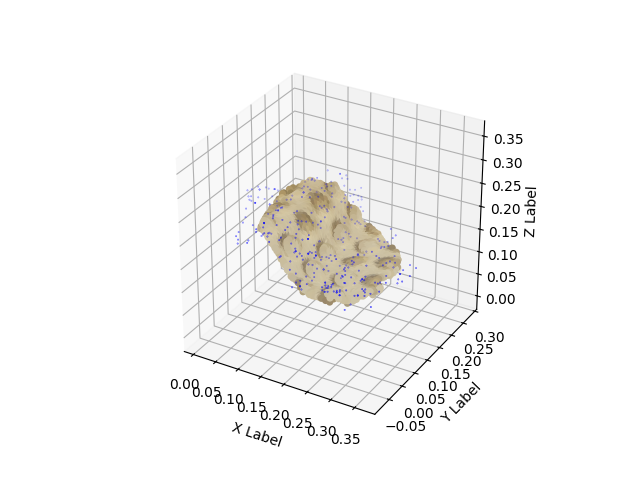

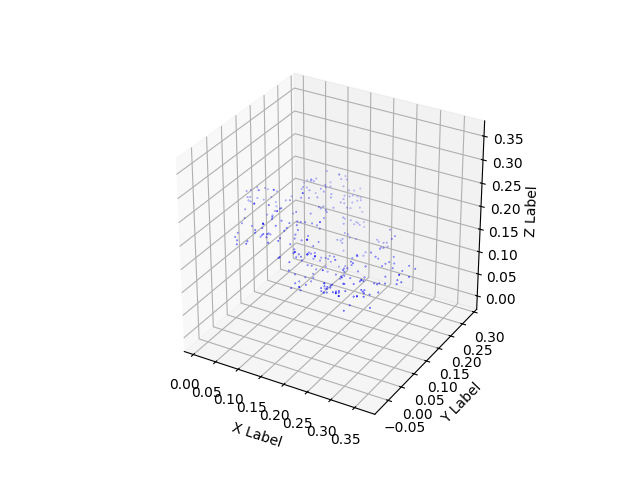

tensor([0.0806, 0.0764, 0.0131], device='cuda:0')
tensor([-0.5543,  0.5697, -0.1014], device='cuda:0')
tensor([-0.5543,  0.5697, -0.1014], device='cuda:0') tensor([0.0806, 0.0764, 0.0131], device='cuda:0')
points_torch.shape: torch.Size([2716, 3])
target_descriptor_points.shape: torch.Size([544, 1999])
target_descriptor_points.shape: torch.Size([544, 1999])
loss_points_local:0.1504214, loss_points_local2:0.2105934, loss_domain:0.0036497
loss_points_local:0.0006808, loss_points_local2:0.0000155, loss_domain:0.0001298
loss_points_local:0.0000021, loss_points_local2:0.0000005, loss_domain:0.0000599
loss_points_local:0.0000021, loss_points_local2:0.0000005, loss_domain:0.0000598
loss_points_local:0.0000020, loss_points_local2:0.0000005, loss_domain:0.0000598
loss_points_local:0.0000021, loss_points_local2:0.0000005, loss_domain:0.0000598
loss_points_local:0.0000021, loss_points_local2:0.0000005, loss_domain:0.0000598
loss_points_local:0.0000021, loss_points_local2:0.0000005, loss_domain:0.

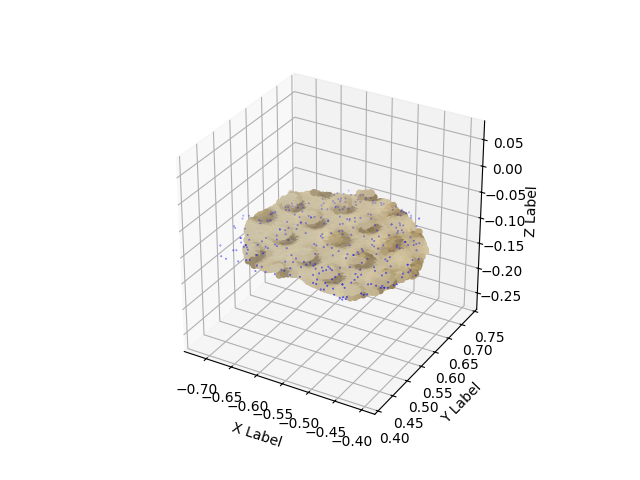

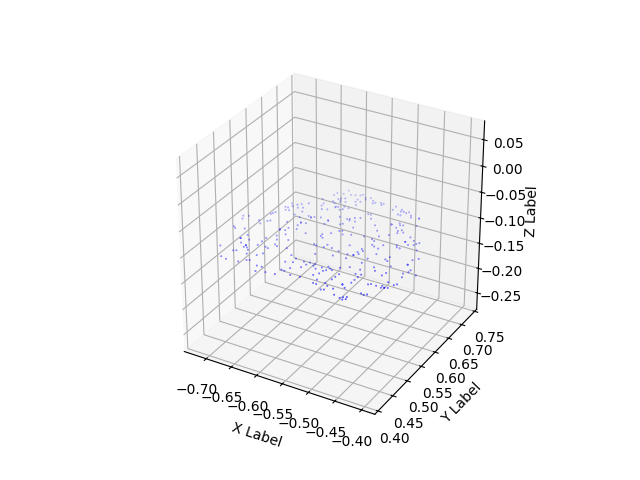

tensor([0.0811, 0.0974, 0.0150], device='cuda:0')
tensor([-0.6595,  0.2700, -0.0689], device='cuda:0')
tensor([-0.6595,  0.2700, -0.0689], device='cuda:0') tensor([0.0811, 0.0974, 0.0150], device='cuda:0')
points_torch.shape: torch.Size([2716, 3])
target_descriptor_points.shape: torch.Size([544, 1999])
target_descriptor_points.shape: torch.Size([544, 1999])
loss_points_local:0.2091272, loss_points_local2:0.2761548, loss_domain:0.0085338
loss_points_local:0.0006357, loss_points_local2:0.0000135, loss_domain:0.0002510
loss_points_local:0.0000214, loss_points_local2:0.0000019, loss_domain:0.0002210
loss_points_local:0.0000216, loss_points_local2:0.0000018, loss_domain:0.0002208
loss_points_local:0.0000217, loss_points_local2:0.0000018, loss_domain:0.0002208
loss_points_local:0.0000216, loss_points_local2:0.0000018, loss_domain:0.0002208
loss_points_local:0.0000216, loss_points_local2:0.0000018, loss_domain:0.0002208
loss_points_local:0.0000216, loss_points_local2:0.0000018, loss_domain:0.

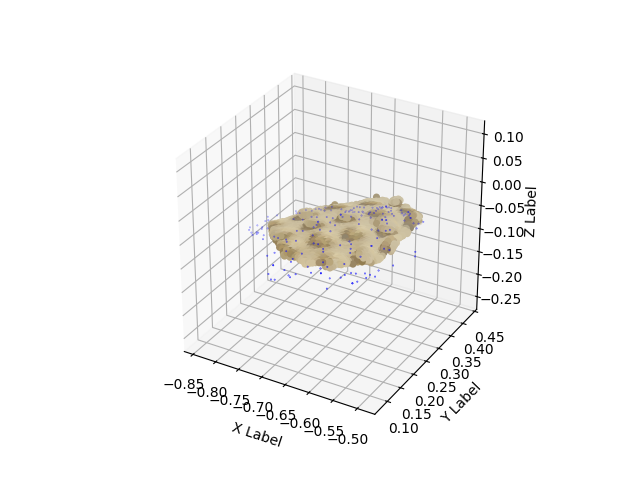

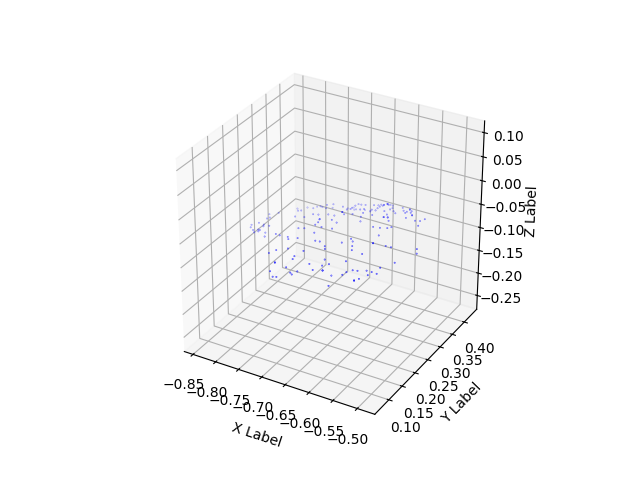

tensor([0.0796, 0.0738, 0.0071], device='cuda:0')
tensor([-0.3124,  0.9462, -0.0783], device='cuda:0')
tensor([-0.3124,  0.9462, -0.0783], device='cuda:0') tensor([0.0796, 0.0738, 0.0071], device='cuda:0')
points_torch.shape: torch.Size([2716, 3])
target_descriptor_points.shape: torch.Size([544, 1999])
target_descriptor_points.shape: torch.Size([544, 1999])
loss_points_local:0.1308137, loss_points_local2:0.1861124, loss_domain:0.0025865
loss_points_local:0.0004057, loss_points_local2:0.0000092, loss_domain:0.0000794
loss_points_local:0.0000037, loss_points_local2:0.0000005, loss_domain:0.0000420
loss_points_local:0.0000029, loss_points_local2:0.0000005, loss_domain:0.0000417
loss_points_local:0.0000026, loss_points_local2:0.0000005, loss_domain:0.0000416
loss_points_local:0.0000024, loss_points_local2:0.0000005, loss_domain:0.0000415
loss_points_local:0.0000022, loss_points_local2:0.0000005, loss_domain:0.0000414
loss_points_local:0.0000020, loss_points_local2:0.0000004, loss_domain:0.

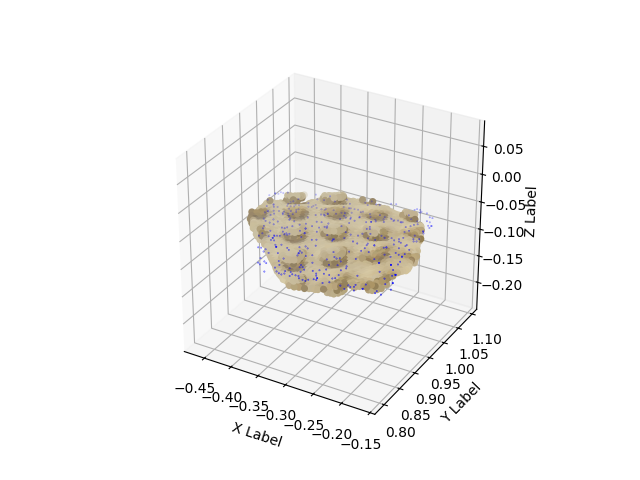

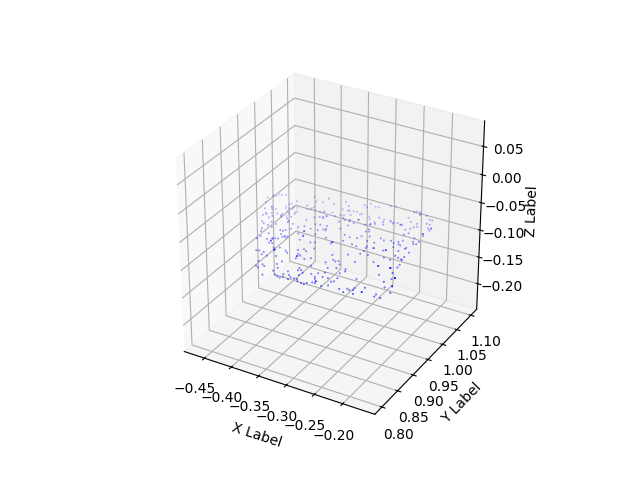

tensor([0.0672, 0.0784, 0.0537], device='cuda:0')
tensor([ 0.3276, -0.4353,  0.1379], device='cuda:0')
tensor([ 0.3276, -0.4353,  0.1379], device='cuda:0') tensor([0.0672, 0.0784, 0.0537], device='cuda:0')
points_torch.shape: torch.Size([2716, 3])
target_descriptor_points.shape: torch.Size([544, 1999])
target_descriptor_points.shape: torch.Size([544, 1999])
loss_points_local:0.1662388, loss_points_local2:0.2272233, loss_domain:0.0046218
loss_points_local:0.0005323, loss_points_local2:0.0000131, loss_domain:0.0001123
loss_points_local:0.0001617, loss_points_local2:0.0000051, loss_domain:0.0001204
loss_points_local:0.0000220, loss_points_local2:0.0000019, loss_domain:0.0000860
loss_points_local:0.0000167, loss_points_local2:0.0000011, loss_domain:0.0000766
loss_points_local:0.0000148, loss_points_local2:0.0000010, loss_domain:0.0000744
loss_points_local:0.0000142, loss_points_local2:0.0000010, loss_domain:0.0000741
loss_points_local:0.0000141, loss_points_local2:0.0000010, loss_domain:0.

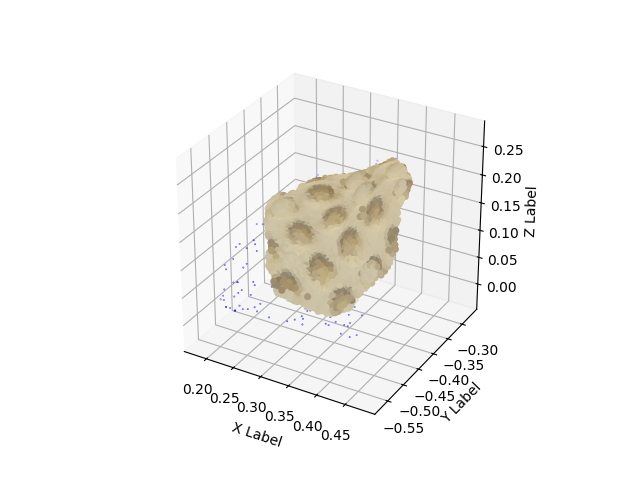

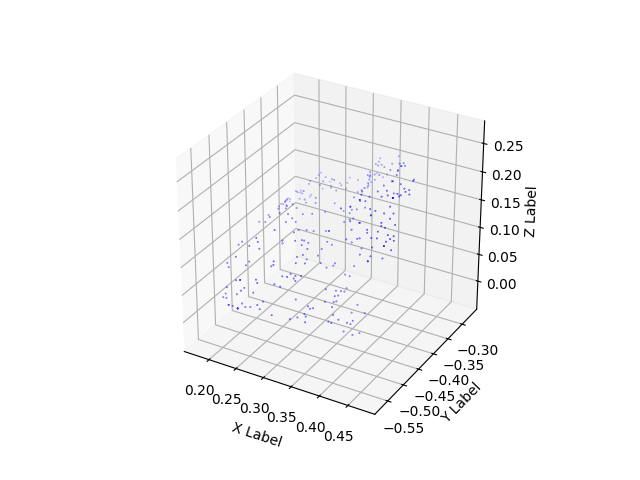

tensor([0.0817, 0.0726, 0.0114], device='cuda:0')
tensor([-1.0060,  0.2854, -0.0830], device='cuda:0')
tensor([-1.0060,  0.2854, -0.0830], device='cuda:0') tensor([0.0817, 0.0726, 0.0114], device='cuda:0')
points_torch.shape: torch.Size([2716, 3])
target_descriptor_points.shape: torch.Size([544, 1999])
target_descriptor_points.shape: torch.Size([544, 1999])
loss_points_local:0.1417491, loss_points_local2:0.1968022, loss_domain:0.0024790
loss_points_local:0.0005551, loss_points_local2:0.0000102, loss_domain:0.0000778
loss_points_local:0.0000050, loss_points_local2:0.0000006, loss_domain:0.0000396
loss_points_local:0.0000033, loss_points_local2:0.0000004, loss_domain:0.0000393
loss_points_local:0.0000029, loss_points_local2:0.0000004, loss_domain:0.0000393
loss_points_local:0.0000031, loss_points_local2:0.0000004, loss_domain:0.0000391
loss_points_local:0.0000030, loss_points_local2:0.0000004, loss_domain:0.0000390
loss_points_local:0.0000029, loss_points_local2:0.0000004, loss_domain:0.

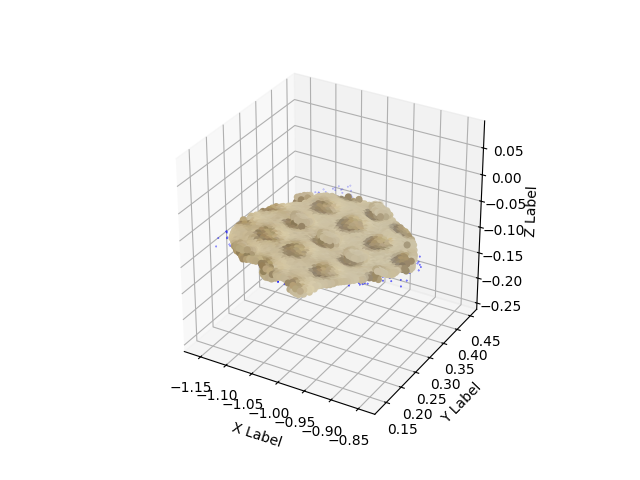

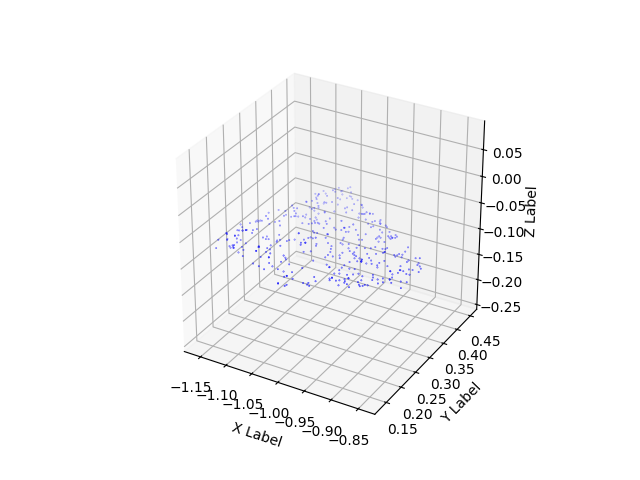

tensor([0.0904, 0.0771, 0.0170], device='cuda:0')
tensor([-0.2657,  0.6863, -0.1172], device='cuda:0')
tensor([-0.2657,  0.6863, -0.1172], device='cuda:0') tensor([0.0904, 0.0771, 0.0170], device='cuda:0')
points_torch.shape: torch.Size([2716, 3])
target_descriptor_points.shape: torch.Size([544, 1999])
target_descriptor_points.shape: torch.Size([544, 1999])
loss_points_local:0.1734893, loss_points_local2:0.2337907, loss_domain:0.0040672
loss_points_local:0.0005655, loss_points_local2:0.0000111, loss_domain:0.0001075
loss_points_local:0.0002131, loss_points_local2:0.0000052, loss_domain:0.0001092
loss_points_local:0.0000036, loss_points_local2:0.0000004, loss_domain:0.0000740
loss_points_local:0.0000033, loss_points_local2:0.0000004, loss_domain:0.0000739
loss_points_local:0.0000030, loss_points_local2:0.0000004, loss_domain:0.0000738
loss_points_local:0.0000028, loss_points_local2:0.0000004, loss_domain:0.0000736
loss_points_local:0.0000026, loss_points_local2:0.0000004, loss_domain:0.

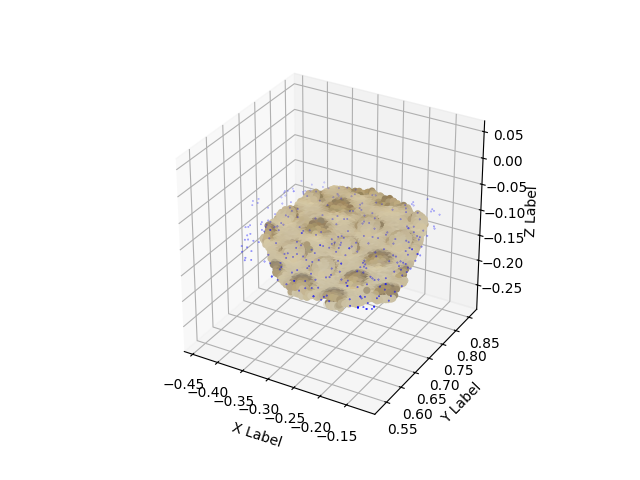

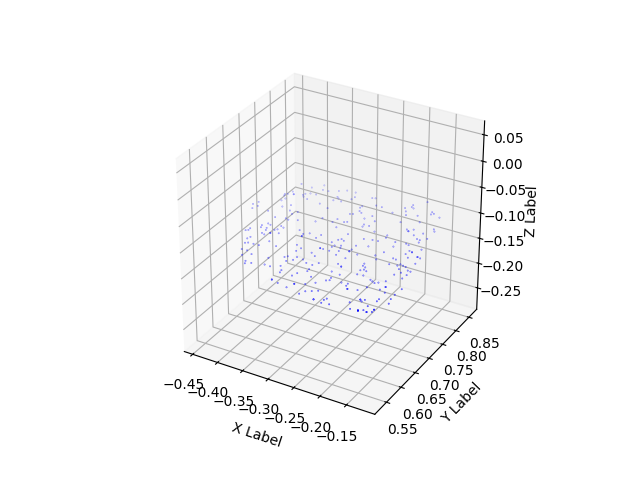

tensor([0.0666, 0.0786, 0.0113], device='cuda:0')
tensor([ 0.8835,  0.1459, -0.0752], device='cuda:0')
tensor([ 0.8835,  0.1459, -0.0752], device='cuda:0') tensor([0.0666, 0.0786, 0.0113], device='cuda:0')
points_torch.shape: torch.Size([2716, 3])
target_descriptor_points.shape: torch.Size([544, 1999])
target_descriptor_points.shape: torch.Size([544, 1999])
loss_points_local:0.1269344, loss_points_local2:0.1782647, loss_domain:0.0029097
loss_points_local:0.0006281, loss_points_local2:0.0000106, loss_domain:0.0000994
loss_points_local:0.0000064, loss_points_local2:0.0000006, loss_domain:0.0000501
loss_points_local:0.0000061, loss_points_local2:0.0000006, loss_domain:0.0000499
loss_points_local:0.0000061, loss_points_local2:0.0000006, loss_domain:0.0000499
loss_points_local:0.0000061, loss_points_local2:0.0000006, loss_domain:0.0000499
loss_points_local:0.0000060, loss_points_local2:0.0000006, loss_domain:0.0000499
loss_points_local:0.0000060, loss_points_local2:0.0000006, loss_domain:0.

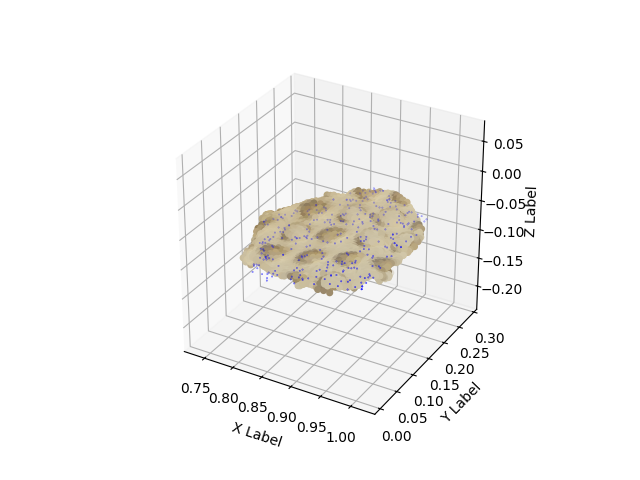

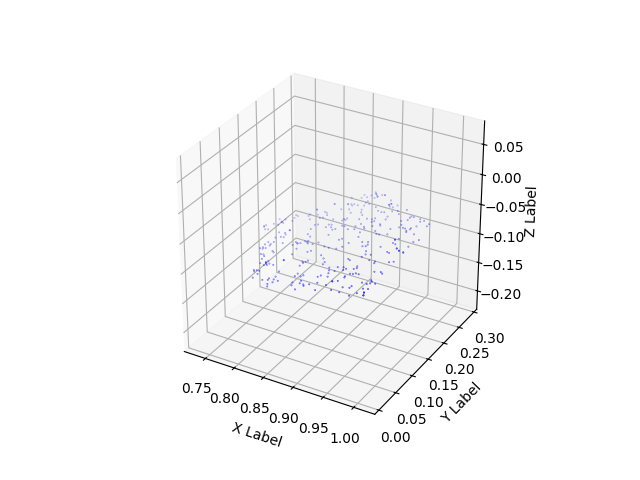

In [48]:
# target_shape_idcs, target_shape_cluster_centers, target_shape_cluster_labels
for cluster_domain_idcs in target_shape_idcs[24:32]:
    domain_points_cluster =  target_gaussians._xyz[cluster_domain_idcs]
    target_points_cluster = fit_target_to_domain(target_points=gaussians_xyz, 
                                                 domain_points=domain_points_cluster)
    
    # Create a 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    #ax.axis('equal')
    ax.set_aspect('equal')
    # Plot target shape
    
    # Plot the scatter points
    if True:
        arr_shape = domain_points_cluster.detach().cpu().numpy()
        ax.scatter(arr_shape[:,0], 
                   arr_shape[:,1], 
                   arr_shape[:,2], c='b', marker='o',s=0.1)
    
    
    # # Plot optimized points
    arr = target_points_cluster.detach().cpu().numpy()
    
    ax.scatter(arr[:,0], 
               arr[:,1], 
               arr[:,2], 
               c=np.concatenate([colors, alpha[:,None]], axis=-1),# c='b', 
               marker='o',
               s=sizes, #s=25.,
               #alpha=alpha,
               depthshade=False,
               edgecolors='none')
               #fillstyle='full',
               #markeredgecolor='red',
               #markeredgewidth=0.0)
    
    # Set labels for the axes
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    
    ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
    # ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
    set_axes_equal(ax) # IMPORTANT - this is also required
    plt.show()

    # Create a 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    #ax.axis('equal')
    ax.set_aspect('equal')
    # Plot target shape
    
    # Plot the scatter points
    if True:
        arr_shape = domain_points_cluster.detach().cpu().numpy()
        ax.scatter(arr_shape[:,0], 
                   arr_shape[:,1], 
                   arr_shape[:,2], c='b', marker='o',s=0.1)
    
    
    
    # Set labels for the axes
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    
    ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
    # ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
    set_axes_equal(ax) # IMPORTANT - this is also required
    plt.show()






tensor([0.0866, 0.0855, 0.0798], device='cuda:0')
tensor([-0.3119, -0.1857, -0.0922], device='cuda:0')
tensor([-0.3119, -0.1857, -0.0922], device='cuda:0') tensor([0.0866, 0.0855, 0.0798], device='cuda:0')
points_torch.shape: torch.Size([2716, 3])
target_descriptor_points.shape: torch.Size([544, 1999])
target_descriptor_points.shape: torch.Size([544, 1999])
loss_points_local:0.2817894, loss_points_local2:0.3611353, loss_domain:0.0106808


/tmp/ipykernel_1190744/2406375008.py:34: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  domain_points_torch = torch.tensor(domain_points.clone().detach(), device=device)


loss_points_local:0.0008006, loss_points_local2:0.0000195, loss_domain:0.0002704
loss_points_local:0.0003163, loss_points_local2:0.0000083, loss_domain:0.0002589
loss_points_local:0.0000285, loss_points_local2:0.0000020, loss_domain:0.0002369
loss_points_local:0.0000291, loss_points_local2:0.0000020, loss_domain:0.0002364
loss_points_local:0.0000293, loss_points_local2:0.0000020, loss_domain:0.0002362
loss_points_local:0.0000307, loss_points_local2:0.0000021, loss_domain:0.0002358
loss_points_local:0.0000306, loss_points_local2:0.0000020, loss_domain:0.0002358
loss_points_local:0.0000305, loss_points_local2:0.0000020, loss_domain:0.0002358
loss_points_local:0.0000311, loss_points_local2:0.0000020, loss_domain:0.0002356
loss_points_local:0.0000311, loss_points_local2:0.0000020, loss_domain:0.0002356


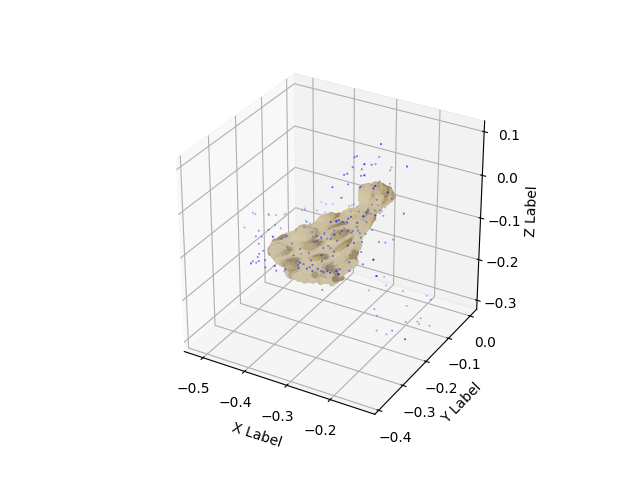

In [40]:
# target_shape_idcs, target_shape_cluster_centers, target_shape_cluster_labels
for cluster_domain_idcs in target_shape_idcs[0:1]:
    domain_points_cluster =  target_gaussians._xyz[cluster_domain_idcs]
    target_points_cluster = fit_target_to_domain(target_points=gaussians_xyz, 
                                                 domain_points=domain_points_cluster)
    
    # Create a 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    #ax.axis('equal')
    ax.set_aspect('equal')
    # Plot target shape
    
    # Plot the scatter points
    if True:
        arr_shape = domain_points_cluster.detach().cpu().numpy()
        ax.scatter(arr_shape[:,0], 
                   arr_shape[:,1], 
                   arr_shape[:,2], c='b', marker='o',s=0.1)
    
    
    # # Plot optimized points
    arr = target_points_cluster.detach().cpu().numpy()
    
    ax.scatter(arr[:,0], 
               arr[:,1], 
               arr[:,2], 
               c=np.concatenate([colors, alpha[:,None]], axis=-1),# c='b', 
               marker='o',
               s=sizes, #s=25.,
               #alpha=alpha,
               depthshade=False,
               edgecolors='none')
               #fillstyle='full',
               #markeredgecolor='red',
               #markeredgewidth=0.0)
    
    # Set labels for the axes
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    
    ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
    # ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
    set_axes_equal(ax) # IMPORTANT - this is also required
    plt.show()






In [169]:
from tqdm import tqdm_notebook as tqdm
def optimize_all_by_clusters(style_cluster_points, domain_points_cluster_list):
    target_points_cluster_list = []
    for domain_points_cluster in tqdm(domain_points_cluster_list):
        target_points_cluster = fit_target_to_domain(target_points=style_cluster_points, 
                                                     domain_points=domain_points_cluster)
        target_points_cluster_list.append(target_points_cluster)
    return target_points_cluster_list

In [148]:
! date
fitted_style_clusters_list = optimize_all_by_clusters(style_cluster_points=gaussians_xyz,  
                                                 domain_points_cluster_list=[target_gaussians._xyz[idcs] for idcs in target_shape_idcs])
! date 

Mon Nov  6 17:37:03 PST 2023


/tmp/ipykernel_1190744/1061637905.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for domain_points_cluster in tqdm(domain_points_cluster_list):


  0%|          | 0/80 [00:00<?, ?it/s]

loss_points_local:0.0041876, loss_points_local2:0.0001596, loss_domain:0.0001952


/tmp/ipykernel_1190744/3419894461.py:34: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  domain_points_torch = torch.tensor(domain_points.clone().detach(), device=device)
/tmp/ipykernel_1190744/3419894461.py:41: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  points_torch = torch.nn.Parameter(torch.tensor(target_points_torch, device=device) * domain_std*5. + domain_mean )


loss_points_local:0.0000280, loss_points_local2:0.0000013, loss_domain:0.0002411
loss_points_local:0.0000193, loss_points_local2:0.0000009, loss_domain:0.0002381
loss_points_local:0.0000176, loss_points_local2:0.0000008, loss_domain:0.0002372
loss_points_local:0.0000166, loss_points_local2:0.0000008, loss_domain:0.0002368
loss_points_local:0.0000160, loss_points_local2:0.0000008, loss_domain:0.0002366
loss_points_local:0.0000157, loss_points_local2:0.0000008, loss_domain:0.0002364
loss_points_local:0.0000157, loss_points_local2:0.0000008, loss_domain:0.0002364
loss_points_local:0.0000154, loss_points_local2:0.0000008, loss_domain:0.0002365
loss_points_local:0.0000152, loss_points_local2:0.0000008, loss_domain:0.0002365
loss_points_local:0.0000152, loss_points_local2:0.0000008, loss_domain:0.0002365
loss_points_local:0.0059693, loss_points_local2:0.0002441, loss_domain:0.0000149
loss_points_local:0.0000500, loss_points_local2:0.0000026, loss_domain:0.0000289
loss_points_local:0.0000092,

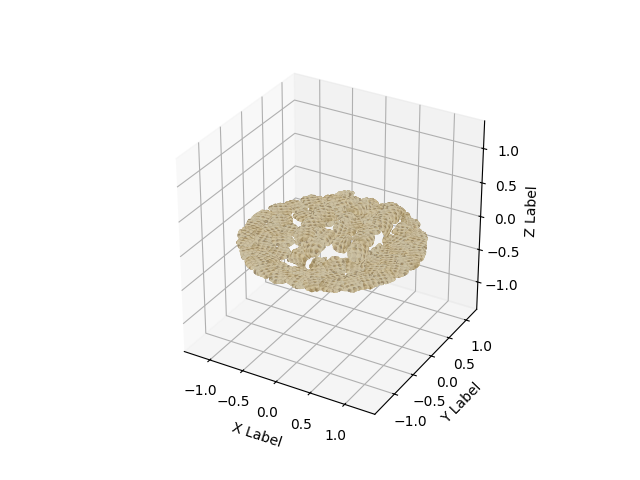

In [62]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
#ax.axis('equal')
ax.set_aspect('equal')
# Plot target shape

# Plot the scatter points
if False:
    arr_shape = domain_points_cluster.detach().cpu().numpy()
    ax.scatter(arr_shape[:,0], 
               arr_shape[:,1], 
               arr_shape[:,2], c='b', marker='o',s=0.1)


# # Plot optimized points
for fitted_style_cluster in fitted_style_clusters_list:
    arr = fitted_style_cluster.detach().cpu().numpy()
    
    ax.scatter(arr[:,0], 
               arr[:,1], 
               arr[:,2], 
               c=np.concatenate([colors, alpha[:,None]], axis=-1),# c='b', 
               marker='o',
               s=sizes / 10., #s=25.,
               #alpha=alpha,
               depthshade=False,
               edgecolors='none')
               #fillstyle='full',
               #markeredgecolor='red',
               #markeredgewidth=0.0)

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
# ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
set_axes_equal(ax) # IMPORTANT - this is also required
plt.show()

In [149]:
import sys
sys.path.append("../")

from scene import GaussianModel
MODEL_DIR = './GT_lego_cluster2/'
#os.makedirs(MODEL_DIR, exist_ok = True)
gaussians_to_save = GaussianModel(sh_degree=3)
#gaussians_to_save.restore(torch.load("/home/dimakot55/output_data/gs_my/gs/GT_lego_cluster2/chkpnt1.pth")[0], opt)
gaussians_to_save.optimizer = torch.optim.Adam([gaussians_to_save._xyz], lr=1e-1)


# Store optimized parameters to the gaussias_to_save
N = len(fitted_style_clusters_list)
gaussians_to_save._xyz = torch.tensor(torch.concat(fitted_style_clusters_list, dim=0).clone().detach())
# gaussians_to_save._xyz = torch.tensor(target_points_torch).clone().detach()
gaussians_to_save._rotation = torch.tensor(np.concatenate([gaussians_rotation]*N, axis=0))
gaussians_to_save._features_dc = torch.tensor(np.concatenate([gaussians_features_dc]*N, axis=0))
gaussians_to_save._features_rest = torch.tensor(np.concatenate([gaussians_features_rest*0.]*N, axis=0))
gaussians_to_save._scaling = torch.tensor(np.concatenate([gaussians_scaling*0.885]*N, axis=0)) #was 0.885
gaussians_to_save._opacity = torch.tensor(np.concatenate([gaussians_opacity]*N, axis=0))


iteration=1
torch.save((gaussians_to_save.capture(), iteration), MODEL_DIR + "/chkpnt" + str(iteration) + ".pth")
gaussians_to_save.save_ply(os.path.join(MODEL_DIR, "point_cloud/iteration_1/", "point_cloud.ply"))



/tmp/ipykernel_1190744/629224335.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  gaussians_to_save._xyz = torch.tensor(torch.concat(fitted_style_clusters_list, dim=0).clone().detach())


# Cluster points on a manifold again. Make sure we cover all the points

In [170]:
target_gaussians_uniform = target_gaussians._xyz[np.concatenate(target_shape_idcs, axis=0)].detach().cpu().numpy()

In [171]:
# Use KMeans clustering to find the centroids of the clusters
kmeans = KMeans(init="k-means++", n_clusters=160, n_init=4)
kmeans.fit(target_gaussians_uniform)

KMeans(n_clusters=160, n_init=4)

In [172]:
kmeans.cluster_centers_

array([[ 4.48715925e-01,  6.36032224e-02, -1.30662054e-01],
       [-2.15034291e-01, -6.62868023e-01,  1.23166718e-01],
       [-5.79377592e-01,  8.69594038e-01, -7.65214339e-02],
       [ 7.57137358e-01, -7.40857959e-01, -6.90496862e-02],
       [-6.88766956e-01, -3.28045875e-01, -1.12448752e-01],
       [ 5.74497521e-01,  8.94745648e-01, -6.66595399e-02],
       [ 1.12735271e+00, -8.55088234e-03, -6.93231001e-02],
       [-4.15356636e-01, -7.42533743e-01, -1.17116146e-01],
       [ 2.38898084e-01, -1.20000935e+00, -6.90329522e-02],
       [ 8.94544944e-02,  2.60284245e-02,  1.89477205e-01],
       [ 6.34728074e-01,  4.92448688e-01,  8.30139220e-02],
       [-9.35358584e-01,  1.03903964e-01, -9.51452851e-02],
       [ 6.36943817e-01, -3.79969537e-01, -4.91675958e-02],
       [-2.28127703e-01,  6.05083227e-01, -1.23503231e-01],
       [-1.65167347e-01, -1.08323669e+00, -7.47422725e-02],
       [-7.61726618e-01, -7.21256793e-01, -8.80373195e-02],
       [-2.79264390e-01,  2.37794802e-01

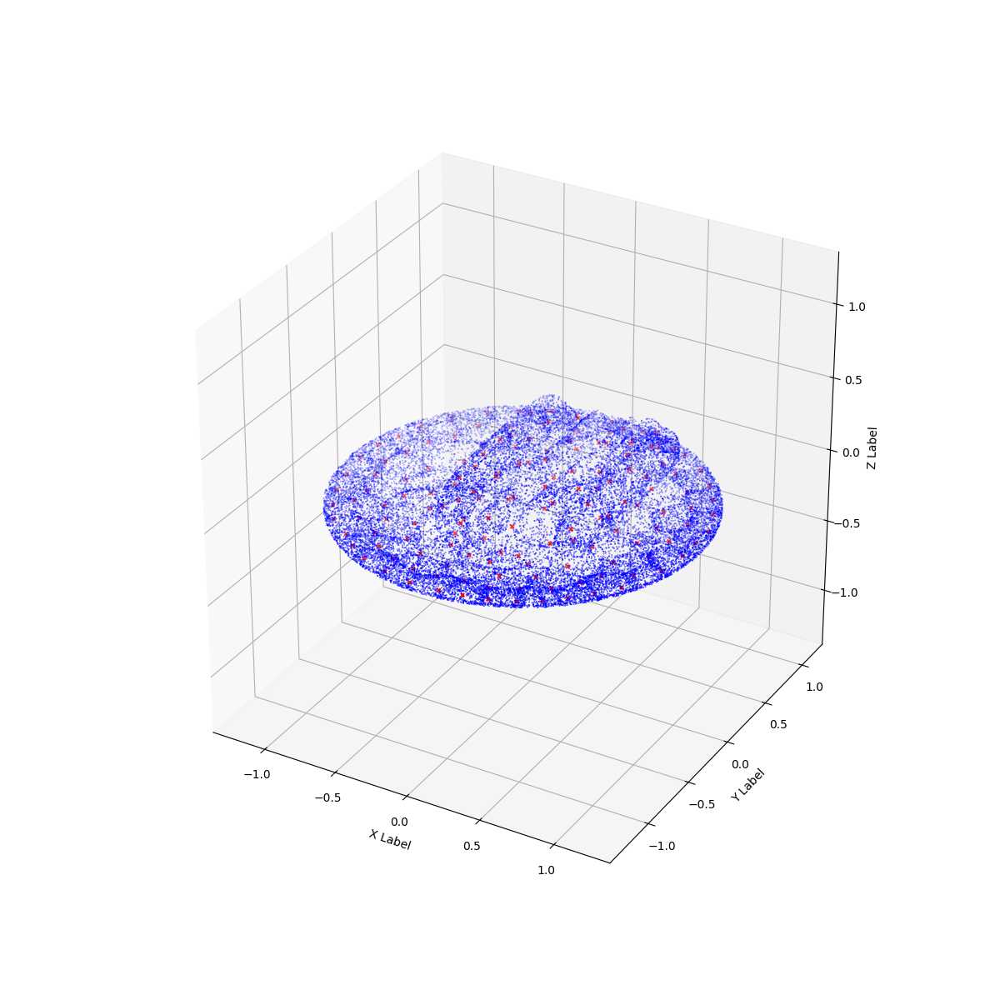

In [173]:

# Create a 3D scatter plot
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
#ax.axis('equal')
ax.set_aspect('equal')
# Plot target shape

# Plot the scatter points
kth=1
if True:
    arr_shape = target_gaussians_uniform
    ax.scatter(arr_shape[::kth,0], 
               arr_shape[::kth,1], 
               arr_shape[::kth,2], c='b', marker='o',s=0.1)

ax.scatter(kmeans.cluster_centers_[:, 0],
           kmeans.cluster_centers_[:, 1],
           kmeans.cluster_centers_[:, 2],
           c='r', marker='x', s=10.)

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key lineµb
# ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
set_axes_equal(ax) # IMPORTANT - this is also required
plt.show()



In [186]:
np.unique(kmeans.labels_)[:]

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159], dtype=int32)

In [187]:
! date
fitted_style_clusters_list = optimize_all_by_clusters(
    style_cluster_points=gaussians_xyz,  
    domain_points_cluster_list=[torch.tensor(target_gaussians_uniform[np.where(kmeans.labels_==lbl)]).to(device="cuda") 
                                for lbl in np.unique(kmeans.labels_)[:]])
! date 

Mon Nov  6 18:07:23 PST 2023


/tmp/ipykernel_1190744/1061637905.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for domain_points_cluster in tqdm(domain_points_cluster_list):


  0%|          | 0/160 [00:00<?, ?it/s]

loss_points_local:0.0057550, loss_points_local2:0.0002110, loss_domain:0.0012931


/tmp/ipykernel_1190744/3419894461.py:34: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  domain_points_torch = torch.tensor(domain_points.clone().detach(), device=device)
/tmp/ipykernel_1190744/3419894461.py:41: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  points_torch = torch.nn.Parameter(torch.tensor(target_points_torch, device=device) * domain_std*5. + domain_mean )


loss_points_local:0.0012845, loss_points_local2:0.0000308, loss_domain:0.0009981
loss_points_local:0.0010358, loss_points_local2:0.0000231, loss_domain:0.0009967
loss_points_local:0.0010306, loss_points_local2:0.0000219, loss_domain:0.0009935
loss_points_local:0.0010171, loss_points_local2:0.0000211, loss_domain:0.0009938
loss_points_local:0.0010203, loss_points_local2:0.0000211, loss_domain:0.0009913
loss_points_local:0.0010193, loss_points_local2:0.0000210, loss_domain:0.0009902
loss_points_local:0.0010137, loss_points_local2:0.0000208, loss_domain:0.0009902
loss_points_local:0.0010131, loss_points_local2:0.0000208, loss_domain:0.0009904
loss_points_local:0.0010131, loss_points_local2:0.0000208, loss_domain:0.0009904
loss_points_local:0.0010131, loss_points_local2:0.0000208, loss_domain:0.0009904
loss_points_local:0.0078105, loss_points_local2:0.0002828, loss_domain:0.0001582
loss_points_local:0.0003814, loss_points_local2:0.0000127, loss_domain:0.0002278
loss_points_local:0.0001839,

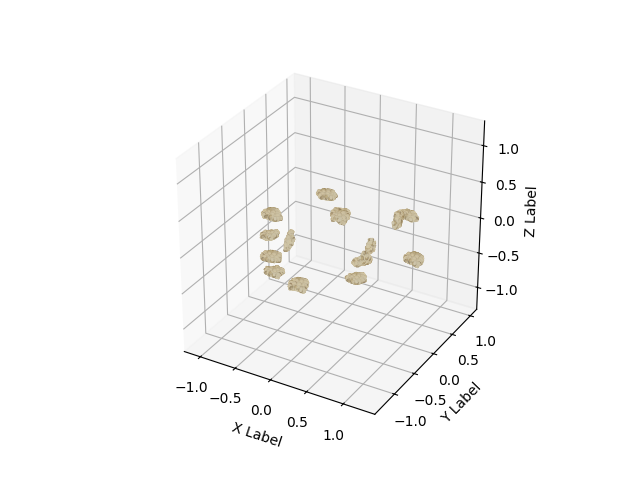

In [184]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
#ax.axis('equal')
ax.set_aspect('equal')
# Plot target shape

# Plot the scatter points
if False:
    arr_shape = domain_points_cluster.detach().cpu().numpy()
    ax.scatter(arr_shape[:,0], 
               arr_shape[:,1], 
               arr_shape[:,2], c='b', marker='o',s=0.1)


# # Plot optimized points
for fitted_style_cluster in fitted_style_clusters_list:
    arr = fitted_style_cluster.detach().cpu().numpy()
    
    ax.scatter(arr[:,0], 
               arr[:,1], 
               arr[:,2], 
               c=np.concatenate([colors, alpha[:,None]], axis=-1),# c='b', 
               marker='o',
               s=sizes / 10., #s=25.,
               #alpha=alpha,
               depthshade=False,
               edgecolors='none')
               #fillstyle='full',
               #markeredgecolor='red',
               #markeredgewidth=0.0)

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
# ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
set_axes_equal(ax) # IMPORTANT - this is also required
plt.show()

In [188]:
import sys
sys.path.append("../")

from scene import GaussianModel
MODEL_DIR = './GT_lego_cluster2/'
#os.makedirs(MODEL_DIR, exist_ok = True)
gaussians_to_save = GaussianModel(sh_degree=3)
#gaussians_to_save.restore(torch.load("/home/dimakot55/output_data/gs_my/gs/GT_lego_cluster2/chkpnt1.pth")[0], opt)
gaussians_to_save.optimizer = torch.optim.Adam([gaussians_to_save._xyz], lr=1e-1)


# Store optimized parameters to the gaussias_to_save
N = len(fitted_style_clusters_list)
gaussians_to_save._xyz = torch.tensor(torch.concat(fitted_style_clusters_list, dim=0).clone().detach())
# gaussians_to_save._xyz = torch.tensor(target_points_torch).clone().detach()
gaussians_to_save._rotation = torch.tensor(np.concatenate([gaussians_rotation]*N, axis=0))
gaussians_to_save._features_dc = torch.tensor(np.concatenate([gaussians_features_dc]*N, axis=0))
gaussians_to_save._features_rest = torch.tensor(np.concatenate([gaussians_features_rest*0.]*N, axis=0))
gaussians_to_save._scaling = torch.tensor(np.concatenate([gaussians_scaling*0.885]*N, axis=0)) #was 0.885
gaussians_to_save._opacity = torch.tensor(np.concatenate([gaussians_opacity]*N, axis=0))


iteration=1
torch.save((gaussians_to_save.capture(), iteration), MODEL_DIR + "/chkpnt" + str(iteration) + ".pth")
gaussians_to_save.save_ply(os.path.join(MODEL_DIR, "point_cloud/iteration_1/", "point_cloud.ply"))



/tmp/ipykernel_1190744/629224335.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  gaussians_to_save._xyz = torch.tensor(torch.concat(fitted_style_clusters_list, dim=0).clone().detach())


# Filter out the overlapping gaussians

In [191]:
print("yo")

yo


In [200]:

def find_overlapping_gaussians(domain, points_list, eps=1e-2):
    # Find centers of every cluster listed in the points_list
    centroids_list = torch.stack([torch.mean(points, dim=0) for points in points_list], axis=0)
    print("1:")
    print(centroids_list)
    # For each domain point find the nearest cluster index from the points_list
    domain_to_centroid_idx = torch.argmin(torch.torch.cdist(domain, centroids_list), dim=-1)
    print("2:")
    print(domain_to_centroid_idx)
    # now compute distance from every point from each cluster from the points_list to the nearest domain points index
    
    points_list_to_domain = []
    for points in points_list:
        
        points_to_domain = torch.argmin(torch.torch.cdist(points, domain), dim=-1)
        points_list_to_domain.append(points_to_domain)
    print("3:")
    print(points_list_to_domain)
    # Find indices of points from each element of the points_list to retain. 
    points_list_idcs_to_retain = []
    for points_idx, points_to_domain in enumerate(points_list_to_domain):
        print("points_to_domain[domain_to_centroid_idx]:")
        print(points_to_domain[domain_to_centroid_idx])
        idcs_to_retain = torch.where(domain_to_centroid_idx[points_to_domain] == points_idx)[0]
        print("idcs_to_retain:",idcs_to_retain)
        points_list_idcs_to_retain.append(idcs_to_retain)

    return points_list_idcs_to_retain

points_torch_list=fitted_style_clusters_list
domain_points_torch=torch.tensor(target_gaussians_uniform, device="cuda")
points_torch_list_idcs_to_retain = find_overlapping_gaussians(domain=domain_points_torch, 
                                                              points_list=points_torch_list)

1:
tensor([[ 0.4783,  0.0848, -0.1351],
        [-0.2180, -0.6625,  0.1265],
        [-0.5785,  0.8656, -0.0766],
        [ 0.7491, -0.7393, -0.0709],
        [-0.6919, -0.3246, -0.1056],
        [ 0.5741,  0.8925, -0.0657],
        [ 1.1282, -0.0119, -0.0698],
        [-0.4161, -0.7458, -0.1168],
        [ 0.2410, -1.1994, -0.0697],
        [ 0.0922,  0.0236,  0.2073],
        [ 0.6369,  0.4925,  0.0872],
        [-0.9288,  0.1036, -0.0963],
        [ 0.6371, -0.3840, -0.0381],
        [-0.2270,  0.6021, -0.1374],
        [-0.1643, -1.0812, -0.0757],
        [-0.7594, -0.7233, -0.0882],
        [-0.2841,  0.2383,  0.1454],
        [ 1.1009, -0.3881, -0.0699],
        [ 0.0418,  0.9103, -0.0675],
        [-0.8985, -0.4085, -0.0936],
        [ 0.1508, -0.7579, -0.0945],
        [ 0.4316, -0.5198, -0.0147],
        [ 0.5989,  0.1413,  0.2010],
        [-0.7168,  0.5915, -0.0822],
        [ 1.0619,  0.3336, -0.0720],
        [-0.2741, -0.2095, -0.0758],
        [ 0.5383, -1.1067, -0.0694]

In [199]:
domain_points_torch.shape

(28627, 3)

In [201]:

import sys
sys.path.append("../")

from scene import GaussianModel
MODEL_DIR = './GT_lego_cluster2/'
#os.makedirs(MODEL_DIR, exist_ok = True)
gaussians_to_save = GaussianModel(sh_degree=3)
gaussians_to_save.optimizer = torch.optim.Adam([gaussians_to_save._xyz], lr=1e-1)


# Store optimized parameters to the gaussias_to_save
N = len(points_torch_list)
idcs_to_retain_list = [idcs.detach().cpu().numpy() for idcs in points_torch_list_idcs_to_retain]
gaussians_xyz_ = [points[idcs] for points, idcs in zip(points_torch_list, points_torch_list_idcs_to_retain)]
gaussians_to_save._xyz = torch.tensor(torch.concat(gaussians_xyz_, dim=0).clone().detach())
gaussians_rotation_ = [gaussians_rotation[idcs] for idcs in idcs_to_retain_list]
gaussians_to_save._rotation = torch.tensor(np.concatenate(gaussians_rotation_, axis=0))
gaussians_features_dc_ = [gaussians_features_dc[idcs] for idcs in idcs_to_retain_list]
gaussians_to_save._features_dc = torch.tensor(np.concatenate(gaussians_features_dc_, axis=0))
gaussians_features_rest_ = [gaussians_features_rest[idcs]*0. for idcs in idcs_to_retain_list]
gaussians_to_save._features_rest = torch.tensor(np.concatenate(gaussians_features_rest_, axis=0))
gaussians_scaling_ = [gaussians_scaling[idcs]*0.885 for idcs in idcs_to_retain_list]
gaussians_to_save._scaling = torch.tensor(np.concatenate(gaussians_scaling_, axis=0)) #was 0.885
gaussians_opacity_ = [gaussians_opacity[idcs] for idcs in idcs_to_retain_list]
gaussians_to_save._opacity = torch.tensor(np.concatenate(gaussians_opacity_, axis=0))
print(gaussians_to_save._xyz.shape, 
      gaussians_to_save._rotation.shape,
      gaussians_to_save._features_dc.shape,
      gaussians_to_save._features_rest.shape,
      gaussians_to_save._scaling.shape,
      gaussians_to_save._opacity.shape,
     )

iteration=1
torch.save((gaussians_to_save.capture(), iteration), MODEL_DIR + "/chkpnt" + str(iteration) + ".pth")
gaussians_to_save.save_ply(os.path.join(MODEL_DIR, "point_cloud/iteration_1/", "point_cloud.ply"))

/tmp/ipykernel_1190744/2026778237.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  gaussians_to_save._xyz = torch.tensor(torch.concat(gaussians_xyz_, dim=0).clone().detach())


torch.Size([365762, 3]) torch.Size([365762, 4]) torch.Size([365762, 1, 3]) torch.Size([365762, 15, 3]) torch.Size([365762, 3]) torch.Size([365762, 1])


# Uniform coverage of the shape with clusters

## First estimate radius of the cluster.

In [202]:
gaussians_xyz

array([[-0.07465547,  0.11866948,  0.0086115 ],
       [-0.03530845, -0.12162796, -0.00211443],
       [-0.09138778, -0.01650941, -0.00209033],
       ...,
       [-0.02692828,  0.13513935, -0.000349  ],
       [ 0.00359106, -0.0952253 , -0.00369157],
       [-0.11183254,  0.02411184, -0.00409095]], dtype=float32)

In [205]:
from scipy.spatial import distance
def get_cluster_radius(cluster_points):
    """
    Computes minimum and maximum of all the largest pairwise distances
    in the cluster. These correspond to the largest inner and largest outter circle.
    Main assumption is that the shape is connected. For flat surfaces use the 
    largest area and decrease it a bit. 
    :param cluster_points: Numpy array of shape [N,d]
    :return inner diameter and outer diameter 
    """

    pairwise_distances = distance.cdist(cluster_points, cluster_points)
    pairwise_max_distances = np.max(pairwise_distances, dim=1)
    outer_max_d = np.max(pairwise_max_distances)
    inner_max_d = np.min(pairwise_max_distances)
    return inner_max_d, outer_max_d

get_cluster_radius(gaussians_xyz_)

NameError: name 'cluster_points' is not defined

In [ ]:
import numpy as np
from scipy.spatial import distance

def region_growing_sampling(points, r):
    # Calculate pairwise distances between all points
    pairwise_distances = distance.cdist(points, points)

    sampled_points = []  # List to store the final sampled points

    while len(points) > 0:
        # Initialize a new region with the first point in the remaining set
        region = [points[0]]
        region_indices = [0]
        remaining_indices = list(range(1, len(points)) )
        i = 0

        while i < len(region_indices):
            current_point = region[i]

            # Find neighboring points within distance 'r'
            neighbors = [idx for idx in remaining_indices if pairwise_distances[region_indices[i]][idx] <= r]
            neighbors = [points[idx] for idx in neighbors]

            # Add neighbors to the region
            region.extend(neighbors)
            region_indices.extend(neighbors)
            remaining_indices = [idx for idx in remaining_indices if idx not in neighbors]
            i += 1

        # Sample points uniformly within the region (e.g., using a grid-based approach)
        # Here, we just select the center point of the region as the sample, but you can use a more sophisticated method.
        if len(region) > 0:
            sampled_points.append(region[len(region) // 2])

        # Remove the points in the region from the remaining set
        points = [p for idx, p in enumerate(points) if idx not in region_indices]

    return np.array(sampled_points)

# Example usage:
N = 100  # Number of points in the point cloud
r = 0.1  # Diameter threshold
point_cloud = np.random.rand(N, 3)  # Replace with your point cloud data

sampled_points = region_growing_sampling(point_cloud, r)